![](https://i.imgur.com/tzWwJLY.png)

# Competition Baseline - Object Detection + Classification

**Welcome!** This notebook provides a simple YOLOv8 baseline to get you started.

## What this notebook does:
1. ✅ Loads and prepares the dataset
2. ✅ Trains a YOLOv8 object detection model
3. ✅ Generates a valid submission file
4. ✅ Uses "-" for images with no detections (required format)

## Competition Metric:
**Final Score = 0.5 × mAP@[0.5:0.95] + 0.5 × F1-Score**

---

In [1]:
# Install required packages
!pip install ultralytics -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 21.2 MB/s eta 0:00:00a 0:00:01


In [2]:
# Import libraries
import os
import shutil
import pandas as pd
from pathlib import Path
from ultralytics import RTDETR

from sklearn.model_selection import train_test_split
from tqdm import tqdm

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


## 📁 Configuration
Update `ROOT_DIR` to point to your dataset location

In [3]:
# Update this path to match your dataset
ROOT_DIR = "/kaggle/input/dal-shemagh-detection-challenge"
WORK_DIR = "./yolo_data"

print(f"Dataset directory: {ROOT_DIR}")
print(f"Working directory: {WORK_DIR}")

Dataset directory: /kaggle/input/dal-shemagh-detection-challenge
Working directory: ./yolo_data


## 📊 Load Data

In [4]:
# Load training labels
train_df = pd.read_csv(os.path.join(ROOT_DIR, "train_labels.csv"))
print(f"Training images: {len(train_df)}")
print("\nFirst few rows:")
display(train_df.head())

Training images: 651

First few rows:


,filename,right_place
0,0.jpg,False
1,1.jpg,False
2,2.jpg,False
3,3.jpg,False
4,4.jpg,False


## ✂️ Train/Validation Split
Split data 80/20 with stratification by category

In [5]:
# Split into train (80%) and validation (20%)
train_data, val_data = train_test_split(
    train_df,
    test_size=0.2,
    random_state=42,
)

print(f"Train set: {len(train_data)} images")
print(f"Validation set: {len(val_data)} images")

Train set: 520 images
Validation set: 131 images


## 🗂️ Prepare YOLO Directory Structure
YOLO expects images and labels in specific folders

In [6]:
# Create directories
for split in ['train', 'val']:
    os.makedirs(f"{WORK_DIR}/images/{split}", exist_ok=True)
    os.makedirs(f"{WORK_DIR}/labels/{split}", exist_ok=True)

def prepare_yolo_split(df, split_name):
    """Copy images and labels to YOLO format directories"""
    print(f"\nPreparing {split_name} set...")
    
    for _, row in tqdm(df.iterrows(), total=len(df)):
        filename = row['filename']
        stem = Path(filename).stem
        
        # Copy image
        src_img = os.path.join(ROOT_DIR, "images/train", filename)
        dst_img = os.path.join(WORK_DIR, f"images/{split_name}", filename)
        shutil.copy(src_img, dst_img)
        
        # Copy label (create empty if doesn't exist)
        src_lbl = os.path.join(ROOT_DIR, "labels/train", f"{stem}.txt")
        dst_lbl = os.path.join(WORK_DIR, f"labels/{split_name}", f"{stem}.txt")
        
        if os.path.exists(src_lbl):
            shutil.copy(src_lbl, dst_lbl)
        else:
            # Empty label = no objects in image
            open(dst_lbl, 'w').close()

# Prepare both splits
prepare_yolo_split(train_data, 'train')
prepare_yolo_split(val_data, 'val')

print("\n✓ YOLO directories ready!")


Preparing train set...


100%|██████████| 520/520 [00:08<00:00, 63.07it/s]



Preparing val set...


100%|██████████| 131/131 [00:02<00:00, 61.76it/s]


✓ YOLO directories ready!


## ⚙️ Create YOLO Configuration

In [7]:
# Create data.yaml config file
yaml_content = f"""path: {os.path.abspath(WORK_DIR)}
train: images/train
val: images/val

nc: 2
names: ['Face', 'Shemagh']
"""

with open(f"{WORK_DIR}/data.yaml", "w") as f:
    f.write(yaml_content)

print("✓ Configuration created!")
print("\nContent:")
print(yaml_content)

✓ Configuration created!

Content:
path: /kaggle/working/yolo_data
train: images/train
val: images/val

nc: 2
names: ['Face', 'Shemagh']



## 🚀 Train YOLO Model

Training YOLOv8n (nano) - fastest model, good baseline.

**To improve:** Try `yolov8s.pt`, `yolov8m.pt`, or `yolov8l.pt` for better accuracy

In [8]:
import albumentations as A

imgtransform = A.Compose([
    # A.Resize((640, 640)),
    A.HorizontalFlip(p=0.5),
    A.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1),
    A.GaussianBlur(p=0.1),
    A.Rotate(limit=10),
])

In [9]:
import torch
print("CUDA Available:", torch.cuda.is_available())
if torch.cuda.is_available():
    print("GPU Name:", torch.cuda.get_device_name(0))


CUDA Available: True
GPU Name: Tesla T4


In [10]:
# Initialize model
model = RTDETR("rtdetr-l.pt")   

results = model.train(
    data=f"{WORK_DIR}/data.yaml",
    epochs=200,
    imgsz=640,
    batch=8,          # RT-DETR أثقل
    optimizer="AdamW",
    lr0=1e-4,         # أقل من YOLO
    weight_decay=1e-4,
    device=0,
    save=True,
    plots=True
)

print("\n✓ Training complete!")


Ultralytics 8.4.14 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=./yolo_data/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=200, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=rtdetr-l.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=AdamW, overlap_mask=True, patience=100, perspective=0.0, pl

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      1/200      6.53G       1.28      2.751      1.245         14        640: 100% ━━━━━━━━━━━━ 65/65 1.6it/s 41.6s0.5ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 1.4it/s 6.3s0.3s
                   all        131        119   0.000878      0.392     0.0103     0.0029

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      2/200      7.01G     0.8668      1.238     0.6755         11        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      2/200      7.01G      0.867      1.215     0.6955          7        640: 100% ━━━━━━━━━━━━ 65/65 1.8it/s 36.2s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.9it/s 2.3s0.3s
                   all        131        119    0.00104      0.466     0.0367     0.0136

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      3/200       7.1G     0.7193      1.385     0.4053         11        640: 0% ──────────── 0/65  0.5s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      3/200       7.1G     0.5821      1.576     0.3799         18        640: 100% ━━━━━━━━━━━━ 65/65 1.8it/s 36.8s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119     0.0011      0.477     0.0365     0.0203

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      4/200      7.19G     0.4005      1.623     0.2478         22        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      4/200      7.19G     0.4188       1.79     0.2789          9        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.8s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119     0.0076      0.472     0.0331     0.0219

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      5/200      7.23G     0.3524      1.802     0.1569         12        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      5/200      7.28G     0.4013      1.719     0.2661         14        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.2s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.512      0.386     0.0514     0.0363

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      6/200      6.87G     0.4236      1.632     0.3246         18        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      6/200      6.87G     0.3821      1.677     0.2553         13        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.5s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.514      0.222     0.0625     0.0431

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      7/200      7.26G     0.4927      1.477     0.2423         18        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      7/200      7.26G      0.334       1.68     0.2027         24        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.4s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.521      0.165     0.0382     0.0256

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      8/200      6.67G     0.5795      1.292     0.3135         24        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      8/200      6.67G     0.3451      1.643     0.2193         24        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.4s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119       0.52       0.25     0.0485     0.0327

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      9/200      7.12G     0.2439      1.875     0.1728         10        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      9/200      7.13G     0.2963      1.637     0.1884         14        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119     0.0166      0.853      0.073     0.0563

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     10/200      7.21G     0.3232      1.777     0.2345         13        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     10/200      7.21G     0.2684      1.669     0.1852         16        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119     0.0224      0.773     0.0697     0.0537

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     11/200      6.82G     0.3967      1.421     0.4035         16        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     11/200      6.82G     0.2469      1.614     0.1596         12        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119     0.0291      0.625     0.0898     0.0621

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     12/200      7.24G     0.6086      1.262     0.2713         17        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     12/200      7.24G     0.2794      1.589      0.174         20        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119     0.0531      0.329     0.0753     0.0577

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     13/200      7.28G     0.1566       1.55     0.1168         13        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     13/200      7.33G     0.2434      1.588     0.1548         19        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119     0.0359      0.525     0.0777     0.0526

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     14/200      6.82G      0.213      1.518     0.1757         14        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     14/200      6.83G     0.2453      1.534     0.1484         12        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.4s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.049      0.162     0.0681     0.0463

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     15/200      6.91G     0.2373      1.457     0.1827          9        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     15/200      6.92G     0.2125      1.585     0.1414         14        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.2s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.042       0.27     0.0698     0.0515

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     16/200         7G     0.1119      1.686    0.09508         15        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     16/200      7.01G     0.2373      1.556      0.153         19        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119     0.0414      0.185     0.0787     0.0586

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     17/200      7.09G     0.1069      1.857    0.08496         12        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     17/200      7.09G     0.2125      1.588     0.1303         18        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119     0.0511      0.245      0.062     0.0477

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     18/200      7.18G     0.1387      1.417    0.07952         19        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     18/200      7.23G     0.2186      1.531     0.1314         17        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.4s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119     0.0547      0.263     0.0728     0.0598

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     19/200      6.97G     0.2138      1.311     0.1165         19        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     19/200      6.97G     0.2116      1.517     0.1281         11        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119     0.0526      0.337     0.0743     0.0596

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     20/200      6.84G     0.3238      1.375     0.1908         15        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     20/200      6.84G     0.2195      1.505     0.1397         19        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119     0.0567       0.28     0.0804     0.0669

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     21/200      7.23G     0.1801      1.449    0.09167         13        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     21/200      7.25G     0.1955      1.491     0.1268          9        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119     0.0668      0.308     0.0839     0.0681

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     22/200      6.68G     0.1247      1.473    0.08952         16        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     22/200      6.68G     0.2092      1.483     0.1374         17        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119     0.0645        0.2     0.0856     0.0697

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     23/200      7.15G     0.2067      1.475     0.1688         15        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     23/200      7.15G     0.2053      1.486     0.1221         13        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.4s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119     0.0801      0.365      0.101     0.0823

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     24/200      7.24G      0.438      1.081    0.08486         15        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     24/200      7.24G     0.1954      1.324     0.1239         15        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.5s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.648      0.233       0.25      0.206

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     25/200      6.72G     0.1796      1.142     0.2488         12        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     25/200      6.72G     0.2374      0.953     0.1634          5        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.4s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.585      0.584      0.602      0.496

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     26/200      7.15G     0.1704     0.8699     0.1459          9        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     26/200      7.15G     0.2525      0.628      0.165          8        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.8it/s 2.4s0.3s
                   all        131        119       0.77      0.757      0.796      0.661

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     27/200      7.24G     0.1518     0.7772     0.1704         17        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     27/200      7.24G     0.2555     0.5492     0.1862         10        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.727        0.8      0.793      0.645

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     28/200      6.83G     0.2557     0.4525     0.1911         14        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     28/200      6.83G     0.2112     0.5661     0.1713         14        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.4s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.759       0.81      0.802       0.65

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     29/200      7.22G     0.2499     0.3256    0.09466         17        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     29/200      7.25G     0.2408     0.5332      0.185         18        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.5s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.758      0.826      0.777      0.646

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     30/200      6.79G     0.2097     0.4124     0.1054         14        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     30/200      6.79G     0.2381     0.5681      0.177         13        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.4s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.722      0.854      0.786      0.632

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     31/200      7.25G     0.2371     0.6022     0.1891         13        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     31/200      7.25G     0.2327     0.4375     0.1699         19        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.778      0.745      0.776      0.639

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     32/200      6.77G     0.0716     0.4632     0.1349          6        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     32/200      6.77G     0.2367     0.4424     0.1749         17        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119       0.85      0.837      0.872       0.71

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     33/200      7.25G     0.1524     0.7265     0.2061          8        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     33/200      7.25G     0.2109      0.436     0.1669         13        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.753      0.878      0.805      0.653

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     34/200      6.79G     0.2711     0.3404     0.2685         16        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     34/200      6.79G      0.211     0.4416     0.1606         19        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119       0.82      0.895      0.835      0.666

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     35/200      7.26G     0.2062     0.3594     0.1532         16        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     35/200      7.26G     0.2207     0.4566     0.1658         13        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.858      0.888       0.87      0.708

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     36/200      6.78G     0.1145     0.3154    0.09925         10        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     36/200      6.78G      0.205     0.4205     0.1565         15        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.4s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119       0.84      0.855      0.859      0.687

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     37/200       7.2G       0.31     0.6301     0.2412         24        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     37/200      7.25G     0.1895     0.4204     0.1413         16        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119       0.77      0.877      0.829      0.685

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     38/200      6.68G       0.18     0.5107      0.189          8        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     38/200      6.68G     0.2021      0.429     0.1531         14        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.4s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.828      0.874      0.881      0.721

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     39/200      7.16G     0.1474     0.3425      0.108         19        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     39/200      7.16G     0.2082     0.4905     0.1606         14        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.4s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.901      0.874      0.909      0.756

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     40/200      7.24G     0.1873     0.7622     0.2036          8        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     40/200      7.25G     0.1962     0.4137     0.1595         12        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.4s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.892      0.885      0.866      0.724

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     41/200      6.71G     0.1181     0.3549     0.1081         18        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     41/200      6.71G     0.1827     0.4315     0.1461         10        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.4s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119       0.86       0.87      0.878      0.728

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     42/200      7.16G     0.2334     0.2626     0.2927         14        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     42/200      7.16G     0.1931     0.4213      0.153         15        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.4s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.856       0.88      0.876      0.737

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     43/200      7.25G     0.2667     0.2645     0.1204         10        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     43/200      7.25G     0.1959     0.4084     0.1657         21        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.905      0.852      0.884      0.753

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     44/200      6.73G     0.1122     0.3384    0.09415         13        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     44/200      6.73G     0.1952     0.4063     0.1405          7        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.4s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.879      0.841      0.874      0.754

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     45/200      7.12G     0.3445     0.4108     0.2171         12        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     45/200      7.16G     0.1945     0.4078     0.1444         13        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.885      0.845      0.874      0.737

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     46/200      7.25G     0.2564     0.4819     0.1871         19        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     46/200      7.25G     0.1946     0.3908     0.1362         18        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.817      0.885      0.864      0.728

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     47/200      6.71G      0.113      0.374    0.06723         15        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     47/200      6.71G     0.1778     0.3841     0.1428         14        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119       0.84      0.869      0.864       0.73

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     48/200      7.14G    0.06519     0.2617    0.06521         11        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     48/200      7.14G     0.1888     0.3943     0.1284         21        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.849      0.853      0.848      0.711

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     49/200      7.23G     0.1989     0.3794     0.1706         12        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     49/200      7.23G     0.1789      0.346      0.123         14        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.873      0.869       0.88      0.738

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     50/200      6.82G     0.2127      1.477     0.2537         12        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     50/200      6.82G      0.172     0.3915      0.127         19        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.897      0.879      0.894      0.739

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     51/200      7.25G     0.1552     0.6708       0.11         14        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     51/200      7.25G     0.1904     0.3692     0.1468         10        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.921      0.896      0.898      0.747

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     52/200      6.68G     0.1083     0.2997     0.1213          8        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     52/200      6.68G      0.179     0.3777     0.1393         10        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.4s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119       0.93       0.84      0.858      0.722

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     53/200       7.1G     0.2821      0.253    0.05485         19        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     53/200      7.15G     0.1632     0.3585      0.125          6        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119        0.9      0.903      0.909      0.768

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     54/200      7.24G     0.1542     0.3618     0.1248         19        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     54/200      7.24G     0.1751     0.3579     0.1356         14        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.4s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.898      0.853      0.878      0.749

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     55/200      6.83G     0.1078     0.2973     0.1178          8        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     55/200      6.83G     0.1668     0.3901     0.1263         14        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.5s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.888      0.869      0.888      0.749

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     56/200      7.26G     0.2209     0.2734     0.1061         15        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     56/200      7.26G     0.1629     0.3299     0.1161         13        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.4s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.879      0.897      0.894      0.761

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     57/200       6.8G    0.09908     0.2623    0.06859         11        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     57/200       6.8G      0.154     0.3392     0.1203          7        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.4s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.885      0.849      0.898      0.762

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     58/200      7.26G     0.2262     0.3799     0.1032         17        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     58/200      7.26G     0.1767     0.3698     0.1557         17        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.4s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.882      0.837      0.879      0.741

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     59/200      6.79G     0.2341     0.7725     0.1754         15        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     59/200      6.79G     0.1606     0.3383     0.1274         12        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.4s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.855      0.863       0.83      0.714

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     60/200      7.25G     0.1355     0.4191     0.1352          9        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     60/200      7.25G     0.1618     0.3223     0.1255         20        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.5s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.913      0.852      0.884      0.761

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     61/200      7.29G     0.1229     0.2399     0.1077         12        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     61/200      7.34G     0.1588     0.3347     0.1166         26        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.4s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.905      0.826      0.878      0.761

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     62/200      6.81G     0.2117     0.3159    0.09575         20        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     62/200      6.81G     0.1723     0.3342      0.135         14        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.962      0.854      0.912      0.781

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     63/200       6.9G     0.1224     0.2161    0.09018          9        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     63/200       6.9G     0.1642     0.3751     0.1148         16        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.4s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.883      0.868      0.888      0.755

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     64/200      6.99G     0.1304     0.2185     0.1374         10        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     64/200      6.99G     0.1674     0.3527     0.1233         26        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.5s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.885      0.874      0.898      0.777

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     65/200      7.08G     0.1632     0.2953     0.1232         11        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     65/200      7.08G      0.161      0.297     0.1269         12        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.5s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.919      0.943      0.924      0.786

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     66/200      7.17G     0.1692     0.2031    0.05681         11        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     66/200      7.21G     0.1527     0.3043     0.1193         10        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.4s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.879       0.92      0.898      0.758

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     67/200      6.85G     0.1063     0.2997     0.1883         10        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     67/200      6.85G     0.1578     0.3353     0.1186         21        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.4s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.937      0.916      0.937      0.781

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     68/200      7.24G      0.134     0.2661     0.1014         10        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     68/200      7.24G     0.1517     0.3314     0.1169         14        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.4s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.895      0.864      0.906      0.776

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     69/200      7.24G    0.09724     0.3548     0.1081         11        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     69/200      7.25G      0.145     0.3158     0.1176         17        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.907       0.88      0.912      0.765

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     70/200      6.78G     0.1891     0.3253     0.1969         13        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     70/200      6.78G      0.158     0.3235     0.1156         11        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.902      0.873      0.909      0.755

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     71/200      7.17G     0.1808     0.6222     0.1245         18        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     71/200      7.17G     0.1651     0.3468     0.1247         15        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.818      0.895      0.877       0.74

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     72/200      7.24G     0.2225     0.3685     0.1637         14        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     72/200      7.24G     0.1512     0.3257     0.1146         16        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.898       0.87      0.901      0.747

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     73/200      6.74G     0.1629     0.2882     0.1551         15        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     73/200      6.74G     0.1284     0.2927     0.1035         25        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.2s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.921      0.846      0.898      0.744

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     74/200      7.15G     0.1519     0.5974     0.1449         10        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     74/200      7.16G     0.1399     0.3273     0.1011         15        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.883      0.929      0.934      0.759

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     75/200      7.25G     0.1687     0.2673     0.1298         25        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     75/200      7.25G     0.1546     0.3227     0.1181         12        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.859      0.907      0.911      0.745

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     76/200      6.81G     0.2098     0.3524    0.08623         16        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     76/200      6.81G     0.1551     0.3395     0.1166         11        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.873       0.93      0.933      0.777

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     77/200      7.21G     0.2834     0.4299     0.2363         12        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     77/200      7.23G     0.1376     0.2878     0.1132          7        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.931      0.877      0.933      0.771

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     78/200      6.77G     0.1164     0.1874     0.1246         15        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     78/200      6.77G     0.1387     0.3136     0.1005         25        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.925      0.882      0.923      0.751

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     79/200      7.25G     0.1862     0.4324     0.1999         16        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     79/200      7.25G     0.1431     0.3228     0.1154         11        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.898      0.946      0.938      0.772

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     80/200       6.8G    0.08417     0.1706    0.08624         14        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     80/200       6.8G     0.1314     0.3124    0.09998         13        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.859      0.908      0.907      0.749

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     81/200      7.25G    0.08737      0.254    0.07793         10        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     81/200      7.25G     0.1284     0.3211     0.1113         20        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.941      0.915      0.931      0.764

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     82/200       6.8G    0.06765     0.1865    0.06427         10        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     82/200       6.8G     0.1413     0.2781     0.1019          9        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.925      0.878      0.916      0.767

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     83/200      7.25G     0.1692     0.5067     0.2308         12        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     83/200      7.26G     0.1441     0.3073     0.1109         14        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.863      0.911      0.914      0.785

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     84/200      6.69G    0.09072     0.2548    0.07756         15        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     84/200      6.69G     0.1471     0.3035     0.1116         16        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119       0.93       0.87       0.93      0.796

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     85/200      7.11G     0.2678     0.2809     0.1311          9        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     85/200      7.16G     0.1469      0.297     0.1258         14        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.922      0.906       0.92      0.789

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     86/200      7.24G     0.0932     0.2363     0.1016         16        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     86/200      7.25G     0.1347     0.2898     0.1145          9        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.915      0.909      0.923      0.792

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     87/200      6.73G    0.08209     0.6639    0.03522          9        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     87/200      6.73G     0.1219     0.2566    0.08531         16        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119       0.91      0.905      0.932      0.796

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     88/200      7.16G     0.2011     0.2307    0.06572         17        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     88/200      7.16G     0.1342     0.2683     0.1104         14        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.942      0.903      0.929      0.793

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     89/200      7.25G     0.1103     0.2076    0.06718          9        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     89/200      7.25G     0.1421     0.3009     0.1012         13        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.936      0.912      0.929      0.796

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     90/200      6.84G     0.2808     0.3412     0.4766         12        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     90/200      6.84G     0.1351     0.2972      0.105         10        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.904      0.869      0.879       0.75

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     91/200      7.26G     0.1289     0.2794    0.07786         14        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     91/200      7.27G     0.1368     0.2966     0.1103          9        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.2s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.902      0.907      0.912      0.777

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     92/200       6.8G     0.2547     0.1835    0.09876          8        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     92/200       6.8G     0.1433     0.2829    0.09936         20        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.4s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.914      0.896      0.917      0.792

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     93/200       7.2G     0.2226     0.5258     0.1782         14        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     93/200      7.25G     0.1444     0.2942     0.1053         12        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.913      0.883      0.912      0.779

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     94/200      6.69G     0.1049     0.1797     0.1111          8        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     94/200      6.69G     0.1336     0.2724     0.1074         11        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.869      0.901      0.914      0.776

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     95/200      7.15G     0.1204     0.2017    0.08975         19        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     95/200      7.15G     0.1334     0.2735    0.09626         10        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.4s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.878      0.853      0.906      0.771

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     96/200      7.24G    0.06389     0.1635    0.06153         15        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     96/200      7.24G     0.1431     0.2819     0.1084         14        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.868       0.88      0.877      0.742

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     97/200      6.83G    0.09468      0.247     0.1144         11        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     97/200      6.83G     0.1241     0.2727    0.09216         11        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.909      0.873      0.894      0.749

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     98/200      7.25G     0.2086     0.2677    0.05365         13        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     98/200      7.25G      0.147     0.2893     0.1041         14        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.867      0.888      0.905      0.753

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     99/200      6.81G     0.0931     0.1585     0.1018         13        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     99/200      6.81G     0.1393     0.2645    0.09795         13        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.2s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.903       0.89      0.908      0.762

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    100/200      7.25G    0.06248     0.2614    0.06191          8        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    100/200      7.26G     0.1415     0.2674     0.1007          5        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.4s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.902      0.894      0.911      0.786

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    101/200      6.61G     0.3045     0.2221     0.1049         23        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    101/200      6.63G     0.1284     0.2589    0.08952         21        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.901      0.883      0.915      0.773

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    102/200      7.11G     0.1178     0.2516    0.07618         13        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    102/200      7.11G     0.1247     0.2539     0.1001         14        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.2s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.912      0.912      0.936      0.777

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    103/200       7.2G    0.09326     0.2154     0.0699         11        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    103/200       7.2G      0.137     0.2758    0.09961         16        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119        0.9       0.91      0.897      0.765

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    104/200      7.29G    0.09876      0.218    0.07226         12        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    104/200      7.29G     0.1425     0.2688      0.117         16        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.2s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.912      0.896      0.911      0.779

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    105/200      6.73G     0.1792     0.2672     0.1857         14        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    105/200      6.73G     0.1301     0.2902     0.1007         16        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.896       0.92      0.906      0.787

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    106/200      6.82G    0.08243     0.1624    0.07602         13        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    106/200      6.82G     0.1169     0.2301    0.08753         13        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.897      0.871      0.885      0.778

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    107/200      6.91G    0.06042     0.1558    0.05856         11        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    107/200      6.91G     0.1353     0.2579    0.09828         14        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.917      0.885      0.902      0.769

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    108/200         7G     0.1512     0.2934     0.1062         12        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    108/200         7G     0.1351     0.2712    0.09229         13        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.4s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.922      0.879      0.913        0.8

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    109/200      7.04G     0.2109     0.2943     0.2054          9        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    109/200      7.23G      0.129      0.256     0.1024          8        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.4s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.942        0.9      0.942      0.816

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    110/200      6.96G    0.09565     0.1847    0.03856         12        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    110/200      6.96G     0.1191     0.2761    0.09151          9        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.912      0.896      0.908      0.789

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    111/200      6.74G     0.1682      0.427     0.1338          9        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    111/200      6.74G     0.1361     0.2794    0.09522         19        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.2s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.912      0.873      0.906       0.77

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    112/200      7.16G    0.07226     0.3237    0.06447         13        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    112/200      7.17G     0.1307     0.2796    0.09099         17        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.4s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.861      0.923      0.904      0.777

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    113/200      7.25G     0.1348     0.2306     0.1112         14        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    113/200      7.26G     0.1291     0.2607    0.08887         13        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.918      0.874      0.906      0.793

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    114/200      6.85G     0.1409      0.285     0.1988         16        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    114/200      6.85G     0.1337      0.258    0.09909         20        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.8it/s 2.4s0.3s
                   all        131        119      0.926      0.855      0.897      0.773

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    115/200      7.27G     0.1011     0.2473    0.05596         23        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    115/200      7.27G     0.1185     0.2447    0.09236         10        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.898      0.863      0.904      0.781

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    116/200       6.8G     0.2199     0.1537    0.05558         12        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    116/200       6.8G     0.1284     0.2334    0.08877         14        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.876       0.91      0.909      0.782

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    117/200      7.21G     0.1069     0.4202    0.04597         14        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    117/200      7.26G     0.1316     0.2582    0.09634         15        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.872      0.902      0.911      0.793

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    118/200      6.79G    0.08202     0.1805    0.09027          8        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    118/200      6.79G     0.1204     0.2429    0.08591         14        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.905      0.855       0.91      0.789

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    119/200      7.26G     0.1047      0.232     0.1376          7        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    119/200      7.26G     0.1184     0.2492    0.08586         16        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.2s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119       0.85      0.903      0.908      0.795

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    120/200      6.79G     0.1319     0.2229    0.06191         14        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    120/200      6.79G     0.1197     0.2549    0.08423         11        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.865      0.875      0.906      0.784

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    121/200      7.25G     0.1278      0.183     0.2859         12        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    121/200      7.25G     0.1196     0.2465      0.102          9        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.922      0.855      0.916      0.798

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    122/200      6.79G     0.1249     0.1987    0.08091         16        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    122/200      6.79G     0.1409     0.2609    0.08619         10        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.2s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.862      0.902      0.912      0.787

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    123/200      7.25G      0.119     0.1816     0.1045         16        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    123/200      7.25G     0.1216     0.2463    0.09904         10        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.923      0.862      0.912      0.797

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    124/200      6.68G     0.1127     0.2378      0.199          6        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    124/200      6.68G     0.1171     0.2405    0.08783         17        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.878      0.927      0.903      0.755

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    125/200       7.1G    0.06434      0.239    0.06693         10        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    125/200      7.15G     0.1225     0.2483    0.08367         11        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.2s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119        0.9      0.893      0.906      0.774

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    126/200      7.24G     0.1013      0.319    0.06585         12        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    126/200      7.24G     0.1224     0.2379    0.09539         14        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.918      0.912      0.933      0.808

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    127/200      6.73G    0.06982     0.1549    0.07695          9        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    127/200      6.73G      0.115     0.2399    0.09585         15        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119       0.85      0.926      0.912      0.786

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    128/200      7.16G     0.0848     0.3307    0.08581         15        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    128/200      7.16G      0.121     0.2244    0.08935         13        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119       0.92      0.883      0.909      0.775

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    129/200      7.25G     0.2989     0.2985    0.06716         16        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    129/200      7.25G     0.1192     0.2404    0.08376         21        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.2s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.889       0.87      0.914       0.78

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    130/200      6.81G    0.08286     0.1645    0.03542         23        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    130/200      6.81G     0.1198     0.2646     0.0875         13        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.883      0.896       0.91      0.782

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    131/200      7.23G     0.1355     0.1649    0.06729         13        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    131/200      7.23G     0.1205     0.2262    0.09435         15        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.912      0.866      0.912      0.782

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    132/200      6.76G      0.178      0.248    0.05208         13        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    132/200      6.76G     0.1187     0.2321    0.09022         17        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119       0.92      0.865      0.907      0.781

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    133/200      7.17G      0.266     0.2319    0.05542         12        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    133/200      7.22G     0.1235     0.2582    0.09605         17        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.911      0.848      0.904      0.774

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    134/200      6.79G    0.07944     0.1985     0.1573         11        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    134/200      6.79G     0.1277     0.2384    0.09277         19        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.926      0.845        0.9      0.775

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    135/200      7.26G    0.08995      0.182    0.07659         18        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    135/200      7.26G     0.1267     0.2346    0.09081         11        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.4s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.918      0.865      0.905      0.791

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    136/200      6.67G     0.0786     0.1819    0.07217         11        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    136/200      6.67G      0.115     0.2376    0.08809          8        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.903      0.863      0.904      0.799

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    137/200      7.14G     0.1575     0.1767    0.08135          8        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    137/200      7.14G     0.1037     0.2315    0.07665         10        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.913      0.865       0.91        0.8

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    138/200      7.23G     0.0843     0.3155     0.1127         14        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    138/200      7.23G     0.1096     0.2291    0.07587         11        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.888       0.88      0.902      0.804

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    139/200      6.82G     0.2925     0.1751    0.05013         13        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    139/200      6.82G     0.1143     0.2243    0.08738         13        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.2s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.926      0.883      0.912      0.818

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    140/200      7.25G     0.2062     0.3183     0.1633         15        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    140/200      7.25G     0.1181     0.2088    0.08817         10        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.872      0.918      0.914      0.802

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    141/200      7.29G     0.2113     0.2748    0.08589         12        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    141/200      7.34G     0.1083     0.2271    0.07425         22        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.3s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.905      0.853       0.91      0.797

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    142/200      6.83G     0.1641     0.3094    0.09699         17        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    142/200      6.83G     0.1055     0.2351    0.06919         20        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.6s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.907      0.879      0.913      0.797

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    143/200      6.92G     0.1644     0.2196      0.227          9        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    143/200      6.92G      0.116     0.2302    0.07949         21        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.6s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.916      0.879      0.925      0.788

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    144/200      7.01G    0.06806      0.186    0.05613         10        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    144/200      7.01G     0.1141     0.2448    0.09076         10        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.7s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.928      0.879      0.929      0.805

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    145/200       7.1G     0.1346     0.2065     0.1546         12        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    145/200       7.1G     0.1237     0.2079    0.08428          7        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.7s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.924      0.863       0.92      0.827

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    146/200      7.19G    0.05993     0.3258    0.04576         14        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    146/200      7.19G       0.11       0.23    0.08229         14        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.6s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.917      0.859       0.91      0.811

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    147/200      7.32G     0.1028     0.1863    0.05322         12        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    147/200      7.37G     0.1147      0.254    0.08403         11        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.8s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.905      0.895      0.917      0.813

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    148/200      6.86G    0.07389     0.1603    0.03582         14        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    148/200      6.86G     0.1205     0.2466    0.07401         19        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.7s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.891      0.898      0.906      0.802

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    149/200      6.86G     0.1459     0.1746    0.02211         13        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    149/200      6.86G     0.1121      0.222    0.08229         17        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.6s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.864      0.923       0.91      0.808

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    150/200      6.91G     0.1326     0.1605     0.0565         13        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    150/200      6.91G     0.1147     0.2322    0.08737         15        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.7s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119       0.89      0.905      0.925      0.823

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    151/200         7G     0.2738     0.3331     0.1258         20        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    151/200         7G     0.1136     0.2217    0.08097          5        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.7s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.909      0.905      0.915      0.807

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    152/200      7.14G    0.04874     0.1419    0.04197         13        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    152/200      7.23G     0.1124     0.2472    0.08407         10        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.6s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.892      0.899      0.915      0.816

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    153/200      6.87G    0.06931     0.1736    0.02747         16        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    153/200      6.87G    0.09424     0.2115     0.0688         19        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.8s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119        0.9      0.931      0.917      0.816

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    154/200      7.26G     0.2064     0.2853     0.1375         12        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    154/200      7.26G     0.1189     0.2349    0.09492         15        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.8s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.878      0.931      0.918       0.82

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    155/200      7.26G    0.08391     0.3092    0.07731         19        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    155/200      7.26G     0.1002     0.2159    0.07953         14        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.7s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.937      0.873      0.919      0.819

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    156/200       6.9G      0.114     0.5037     0.0677         10        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    156/200       6.9G     0.1218     0.2425    0.09684         13        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.7s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.928      0.913      0.921      0.823

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    157/200      6.66G    0.09241     0.2191    0.08389         11        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    157/200      6.71G     0.1049     0.2227    0.08038         12        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.7s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.914      0.917      0.922      0.821

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    158/200      7.18G    0.07554     0.1561    0.09308         17        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    158/200      7.19G    0.09866     0.2256    0.07383         10        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.6s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.5s0.3s
                   all        131        119      0.872      0.917      0.909      0.816

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    159/200      7.27G     0.1121     0.4148    0.07105         19        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    159/200      7.28G     0.1169     0.2271    0.08645         17        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.6s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.927        0.9      0.934      0.813

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    160/200      6.81G    0.08397     0.2414    0.07239         12        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    160/200      6.81G    0.09843     0.2073    0.06942         15        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.6s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.928      0.912      0.935      0.816

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    161/200      7.25G    0.09074     0.1855    0.02032         20        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    161/200      7.25G     0.1142     0.2154      0.078         20        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.7s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.955      0.873      0.934      0.811

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    162/200      6.79G    0.07786      0.151    0.03133         16        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    162/200      6.79G     0.1018     0.2008    0.07533         13        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.8s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.898      0.934      0.937      0.817

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    163/200      7.25G     0.1023     0.2199    0.08974         15        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    163/200      7.25G     0.1169     0.2198    0.07801          8        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.7s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.939      0.879      0.937       0.82

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    164/200      6.79G     0.1177     0.1972    0.09509         12        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    164/200      6.79G     0.1103     0.2243    0.08639         14        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.7s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.891       0.93      0.937      0.831

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    165/200       7.2G     0.0614     0.1612    0.04855         10        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    165/200      7.25G      0.113     0.2226    0.08463         15        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.6s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119       0.88      0.927      0.937      0.826

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    166/200      6.78G     0.1917     0.3579    0.08776         16        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    166/200      6.78G       0.12     0.2144    0.08114         18        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.7s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.899      0.897      0.918      0.819

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    167/200      7.25G     0.3231     0.3538    0.07259         15        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    167/200      7.25G     0.1152     0.2147    0.07941          7        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.6s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119        0.9      0.918      0.919      0.821

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    168/200      6.79G    0.05603     0.2113    0.03612         23        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    168/200      6.79G      0.106     0.2042    0.07758         13        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.7s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.896      0.919      0.918      0.818

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    169/200      7.25G    0.09684     0.1891    0.07126          9        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    169/200      7.25G    0.09917     0.1993    0.06842         17        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.6s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.888      0.934      0.918      0.816

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    170/200      6.78G     0.1632     0.2522     0.1657         18        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    170/200      6.78G     0.1091     0.2167     0.0827          9        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.6s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.896      0.929      0.924      0.824

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    171/200      7.25G    0.07828     0.1641    0.04655         11        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    171/200      7.25G     0.1097     0.2142    0.07803         15        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.6s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.901      0.911      0.918      0.826

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    172/200      6.69G    0.06262     0.1893    0.03545         10        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    172/200      6.69G     0.1127     0.2282    0.08705         14        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.6s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.879      0.935      0.908      0.814

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    173/200      7.11G     0.1255     0.1977     0.1192          8        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    173/200      7.16G      0.115     0.2105    0.08095         19        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.6s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.912      0.918      0.915      0.816

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    174/200      7.25G     0.1056     0.2038     0.1425          5        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    174/200      7.25G      0.104     0.2038    0.07808         26        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.7s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.911      0.914      0.922      0.819

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    175/200      6.74G     0.1235      0.245     0.1306         11        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    175/200      6.74G     0.1045     0.2009    0.07854         13        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.6s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.927      0.917      0.935      0.817

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    176/200      7.16G     0.1311     0.2535     0.0871         12        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    176/200      7.16G     0.1052     0.2011    0.08147         18        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.6s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.897      0.945      0.941      0.823

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    177/200      7.25G     0.1226     0.2249    0.04533         11        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    177/200      7.25G     0.1093     0.2017    0.08032         15        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.7s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.878      0.934       0.93      0.815

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    178/200      6.72G     0.0999     0.2553    0.04761         21        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    178/200      6.72G     0.1031     0.2079    0.07501         17        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.7s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.937        0.9      0.936      0.813

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    179/200      7.14G    0.03375    0.09569    0.03607         11        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    179/200      7.14G    0.09867     0.2035     0.0645         20        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.6s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.924      0.868      0.907      0.804

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    180/200      7.23G    0.06183     0.1714    0.06394         10        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    180/200      7.23G     0.1115     0.2134    0.07989         20        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.6s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.904      0.891      0.912      0.802

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    181/200      7.27G     0.1202     0.1426     0.1065          9        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    181/200      7.32G    0.09592     0.2115    0.07619         11        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.6s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.903      0.919      0.918      0.807

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    182/200      6.74G    0.06868     0.1796    0.05766         18        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    182/200      6.74G    0.09604     0.2101    0.06789         16        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.7s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.934       0.89      0.919      0.805

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    183/200      6.82G     0.1292     0.1657     0.1064         11        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    183/200      6.82G     0.1046     0.2188    0.07063         16        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.7s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.918      0.921      0.924      0.805

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    184/200      6.91G    0.09404     0.1735     0.1245          8        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    184/200      6.91G      0.112     0.2084     0.0759         15        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.7s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119       0.94      0.897      0.937      0.814

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    185/200         7G      0.147     0.5812      0.116         10        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    185/200         7G     0.1045      0.218     0.0729          9        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.6s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.945      0.851      0.929       0.81

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    186/200      7.19G    0.08424     0.1785    0.07233         18        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    186/200      7.19G     0.1114     0.2086    0.08172         17        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.7s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.5s0.3s
                   all        131        119      0.949      0.855      0.927       0.81

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    187/200      7.37G    0.06711     0.1716     0.1145         10        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    187/200      7.42G     0.1127     0.2136    0.09072          9        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.6s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.962      0.872      0.939      0.817

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    188/200      6.96G     0.1136     0.2286    0.03633         14        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    188/200      6.96G     0.1035     0.2021    0.07351         15        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.8s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.5s0.3s
                   all        131        119      0.926      0.871      0.922      0.811

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    189/200      6.96G     0.1094     0.2063    0.03431         24        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    189/200      6.96G     0.1081     0.2053    0.07298         16        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.7s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.5s0.3s
                   all        131        119      0.927      0.865       0.92      0.812

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    190/200      7.01G     0.1239     0.3168    0.08891         18        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    190/200      7.01G     0.1002     0.2115    0.07003         15        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.6s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.911      0.867      0.915      0.808
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    191/200      7.09G    0.04575     0.1131    0.08235          4        640: 0% ──────────── 0/65  0.8s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    191/200       7.1G    0.06158     0.1484    0.04762          9        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 38.0s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.6it/s 2.5s0.3s
                   all        131        119      0.918      0.937      0.939      0.804

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    192/200      7.19G    0.05226      0.116    0.03788          6        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    192/200      7.23G     0.0664     0.1475    0.05023          9        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.8s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.5s0.3s
                   all        131        119      0.914      0.932      0.943      0.808

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    193/200      6.96G    0.05596     0.1158    0.03731          9        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    193/200      6.96G    0.06227     0.1493    0.04788         13        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.7s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.908      0.937       0.94      0.808

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    194/200      6.83G    0.09487     0.1633    0.07082         10        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    194/200      6.83G     0.0546     0.1286    0.04131          6        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.8s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.895      0.917      0.931      0.797

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    195/200      7.25G    0.02767    0.07409    0.03737          7        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    195/200      7.25G    0.06272     0.1349    0.04754          8        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.7s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.892      0.911      0.922      0.799

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    196/200       6.8G    0.04827     0.1135    0.03662          4        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    196/200       6.8G    0.06651     0.1484    0.05725          5        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.8s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.918      0.872       0.92      0.793

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    197/200      7.21G     0.0365    0.08901    0.02173          7        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    197/200      7.25G    0.06326     0.1294    0.05312          8        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.7s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.884      0.919      0.923      0.798

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    198/200      6.79G    0.04528     0.1177     0.0353         11        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    198/200      6.79G    0.06187     0.1323    0.04569          4        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.6s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.892      0.907       0.92      0.794

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    199/200      7.26G    0.02937     0.1395    0.05449          6        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    199/200      7.26G    0.06214     0.1352    0.04516          8        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.7s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.5s0.3s
                   all        131        119      0.869      0.913      0.915      0.792

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    200/200      6.78G    0.08706     0.1571    0.03948          7        640: 0% ──────────── 0/65  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:829: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:93.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    200/200      6.78G     0.0669     0.1351    0.04771         11        640: 100% ━━━━━━━━━━━━ 65/65 1.7it/s 37.7s0.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.7it/s 2.4s0.3s
                   all        131        119      0.928      0.872      0.923        0.8

200 epochs completed in 2.284 hours.
Optimizer stripped from /kaggle/working/runs/detect/train/weights/last.pt, 66.2MB
Optimizer stripped from /kaggle/working/runs/detect/train/weights/best.pt, 66.2MB

Validating /kaggle/working/runs/detect/train/weights/best.pt...
Ultralytics 8.4.14 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 14913MiB)
rt-detr-l summary: 310 layers, 31,987,850 parameters, 0 gradients, 103.4 GFLOPs
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.5it/s 2.6s0.3s
                   all        131        119       0.89      0.931      0.938       0.83
             

In [11]:
def calculate_iou(box1, box2):
    """
    Calculate IoU between two boxes (x, y, w, h normalized).
    """
    # Convert from xywh to x1, y1, x2, y2
    b1_x1, b1_x2 = box1[0] - box1[2]/2, box1[0] + box1[2]/2
    b1_y1, b1_y2 = box1[1] - box1[3]/2, box1[1] + box1[3]/2
    
    b2_x1, b2_x2 = box2[0] - box2[2]/2, box2[0] + box2[2]/2
    b2_y1, b2_y2 = box2[1] - box2[3]/2, box2[1] + box2[3]/2

    # Intersection coordinates
    inter_x1 = max(b1_x1, b2_x1)
    inter_y1 = max(b1_y1, b2_y1)
    inter_x2 = min(b1_x2, b2_x2)
    inter_y2 = min(b1_y2, b2_y2)

    inter_area = max(0, inter_x2 - inter_x1) * max(0, inter_y2 - inter_y1)
    b1_area = (b1_x2 - b1_x1) * (b1_y2 - b1_y1)
    b2_area = (b2_x2 - b2_x1) * (b2_y2 - b2_y1)
    
    union_area = b1_area + b2_area - inter_area
    return inter_area / union_area if union_area > 0 else 0


## 📈 Validate Model

In [12]:
# Evaluate on validation set
metrics = model.val()

print("\n" + "="*60)
print("VALIDATION RESULTS")
print("="*60)
print(f"mAP@0.5:0.95: {metrics.box.map:.4f}")
print(f"mAP@0.5:     {metrics.box.map50:.4f}")
print(f"mAP@0.75:    {metrics.box.map75:.4f}")
print("="*60)

Ultralytics 8.4.14 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 14913MiB)
rt-detr-l summary: 310 layers, 31,987,850 parameters, 0 gradients, 103.4 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2154.2±402.0 MB/s, size: 102.8 KB)
val: Scanning /kaggle/working/yolo_data/labels/val.cache... 131 images, 44 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 131/131 68.7Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 1.6it/s 5.7s0.7ss
                   all        131        119       0.89       0.93      0.938      0.831
                  Face         69         88      0.942      0.925      0.967      0.868
               Shemagh         30         31      0.838      0.935      0.909      0.794
Speed: 2.5ms preprocess, 36.7ms inference, 0.0ms loss, 0.4ms postprocess per image
Results saved to /kaggle/working/runs/detect/val

VALIDATION RESULTS
mAP@0.5:0.95: 0.8310
mAP@0.5:     0.9379
mAP@0.75:    0.8810


## 🔮 Generate Submission

Run inference on test set and create submission file

Generating submission file...

Found 842 test images



Inference:   0%|          | 0/842 [00:00<?, ?it/s]


Image: 0.jpg
Right Place: 0
No detections (after filtering)


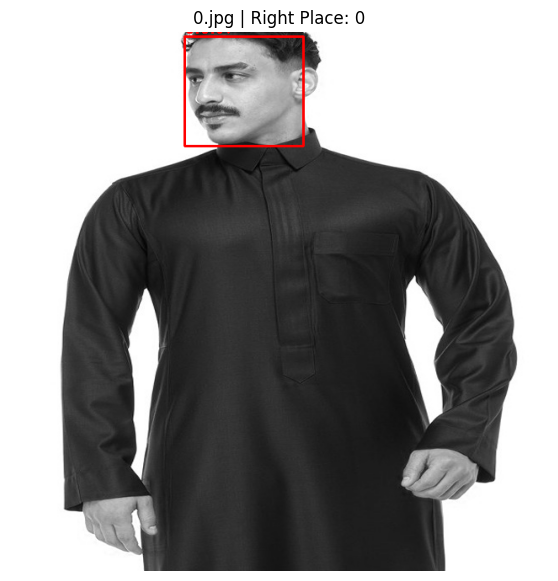

Inference:   0%|          | 1/842 [00:00<04:52,  2.88it/s]


Image: 1.jpg
Right Place: 0
1 0.9478 0.3061 0.5004 0.6115 0.9857


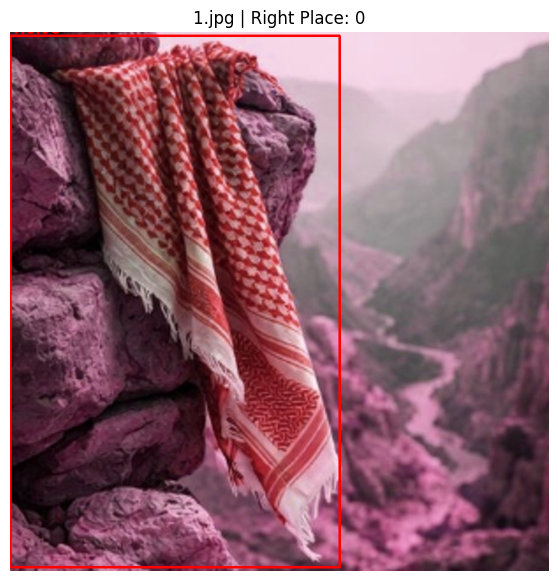

Inference:   0%|          | 2/842 [00:00<04:58,  2.81it/s]


Image: 10.jpg
Right Place: 0
No detections (after filtering)


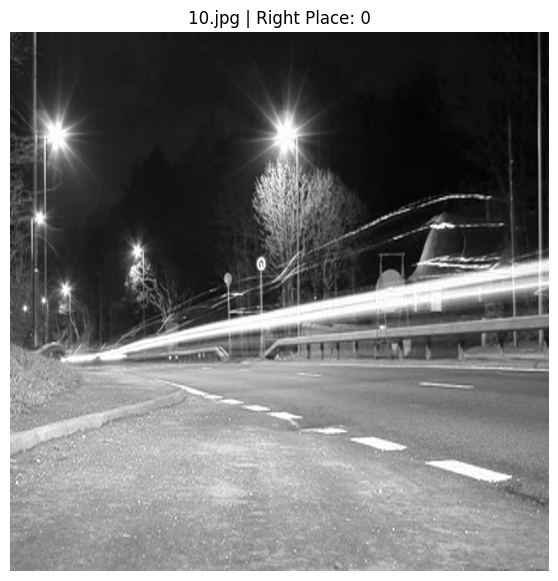

Inference:   0%|          | 3/842 [00:00<04:20,  3.22it/s]


Image: 100.jpg
Right Place: 0
1 0.9725 0.4994 0.5758 0.9954 0.8314


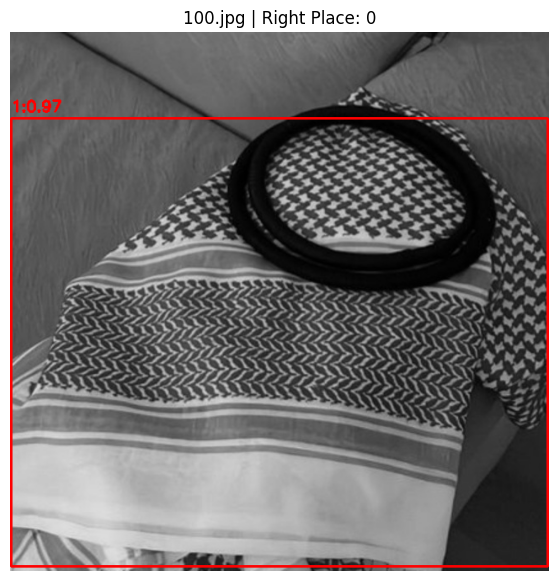

Inference:   0%|          | 4/842 [00:01<04:04,  3.42it/s]


Image: 101.jpg
Right Place: 0
1 0.9375 0.4436 0.6452 0.8825 0.7109


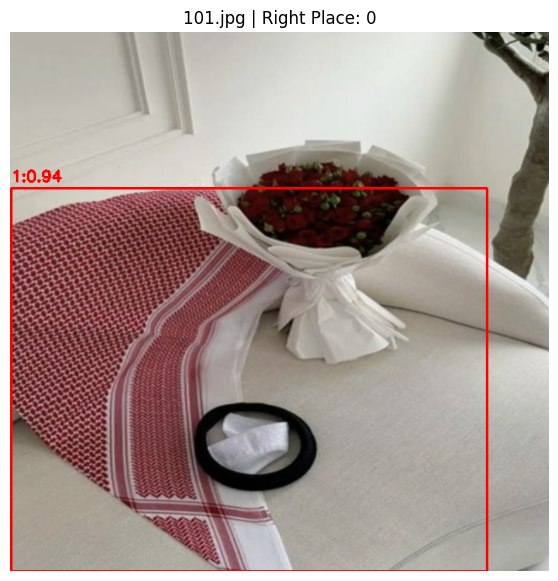

Inference:   1%|          | 5/842 [00:01<04:02,  3.45it/s]


Image: 102.jpg
Right Place: 0
No detections (after filtering)


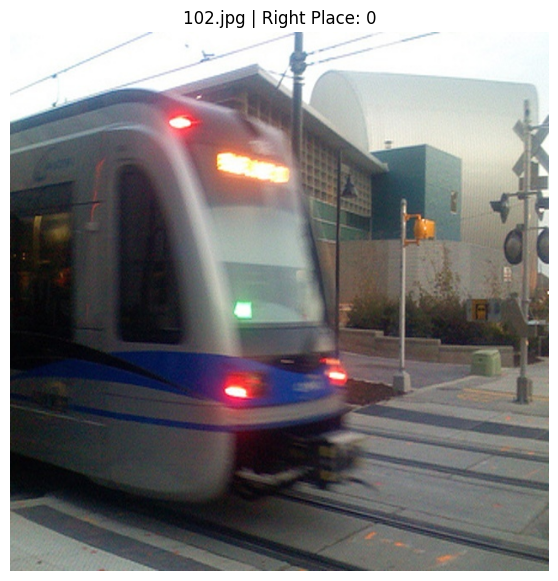

Inference:   1%|          | 6/842 [00:01<04:26,  3.14it/s]


Image: 103.jpg
Right Place: 0
No detections (after filtering)


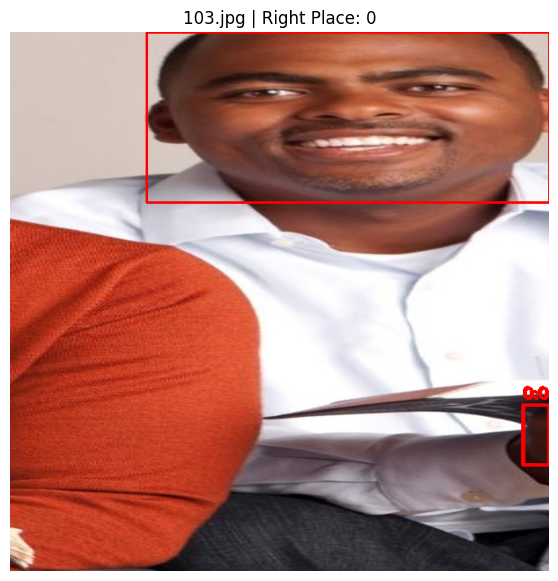

Inference:   1%|          | 7/842 [00:02<04:22,  3.18it/s]

IoU=0.14, center=0.09, area_ratio=6.92

Image: 104.jpg
Right Place: 1
1 0.9415 0.4785 0.1885 0.2426 0.3623


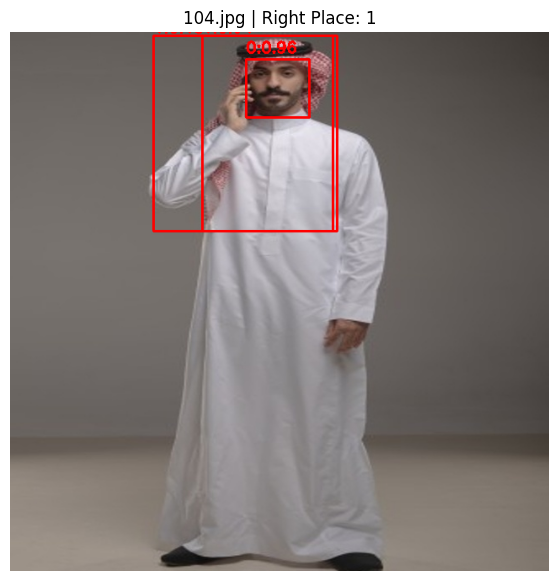

Inference:   1%|          | 8/842 [00:02<03:59,  3.48it/s]


Image: 105.jpg
Right Place: 0
No detections (after filtering)


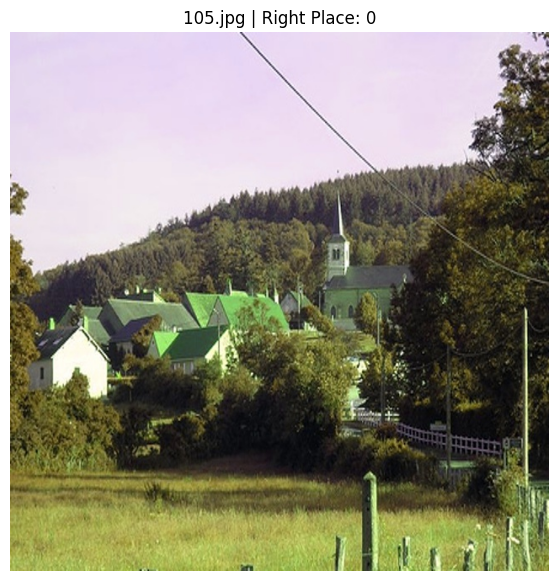

Inference:   1%|          | 9/842 [00:02<04:04,  3.40it/s]


Image: 106.jpg
Right Place: 0
No detections (after filtering)


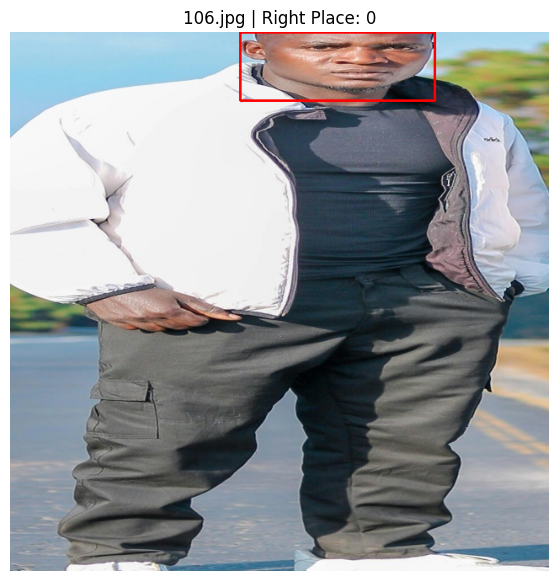

Inference:   1%|          | 10/842 [00:03<04:09,  3.34it/s]


Image: 107.jpg
Right Place: 0
1 0.9755 0.7876 0.7988 0.3168 0.2022


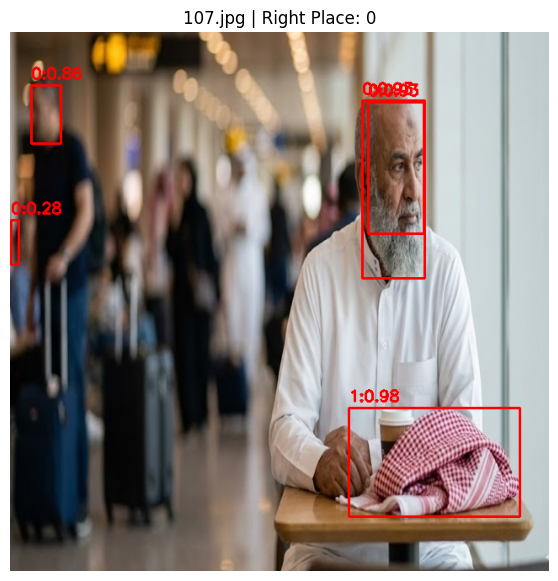

Inference:   1%|▏         | 11/842 [00:03<04:09,  3.33it/s]


Image: 108.jpg
Right Place: 0
No detections (after filtering)


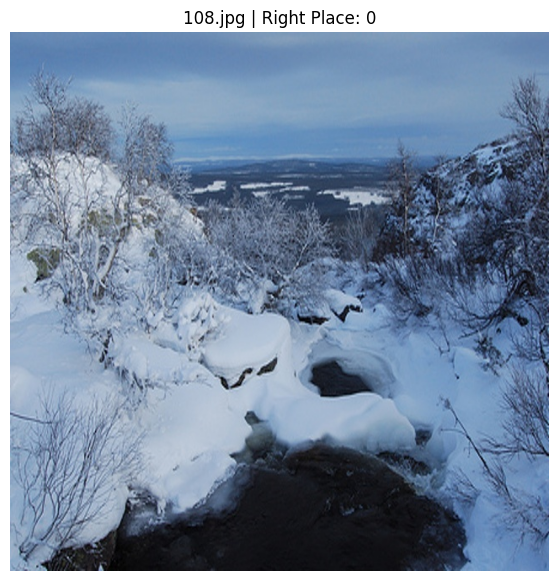

Inference:   1%|▏         | 12/842 [00:03<04:14,  3.26it/s]


Image: 109.jpg
Right Place: 0
1 0.9434 0.4970 0.4452 0.9918 0.7106


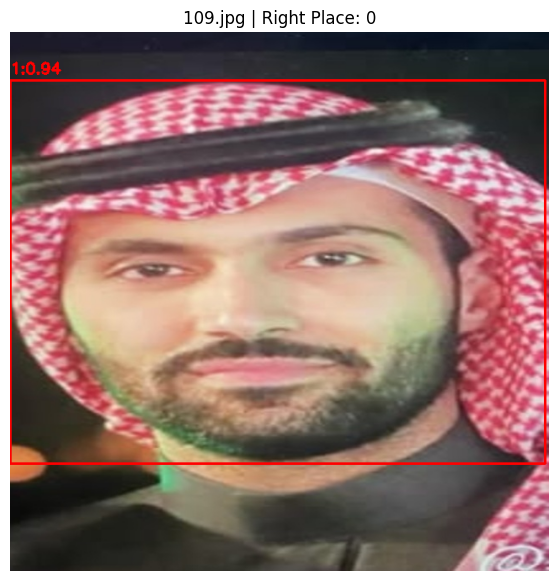

Inference:   2%|▏         | 13/842 [00:03<04:13,  3.27it/s]


Image: 11.jpg
Right Place: 0
No detections (after filtering)


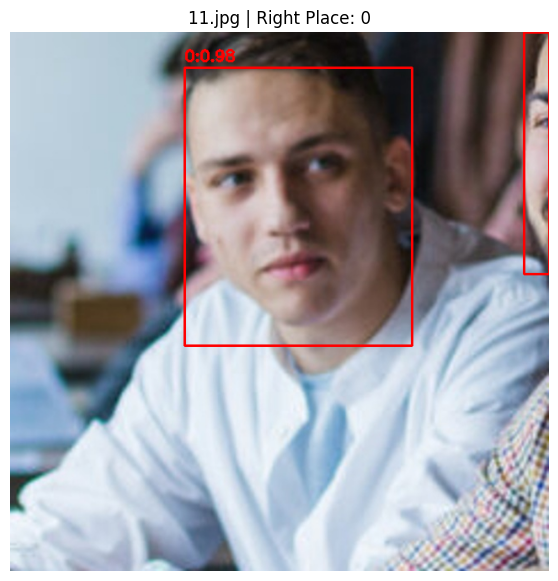

Inference:   2%|▏         | 14/842 [00:04<04:12,  3.27it/s]


Image: 110.jpg
Right Place: 0
1 0.9230 0.7082 0.7744 0.5810 0.4503
1 0.7170 0.4297 0.3268 0.8550 0.5174
1 0.6968 0.0594 0.4687 0.1189 0.6954


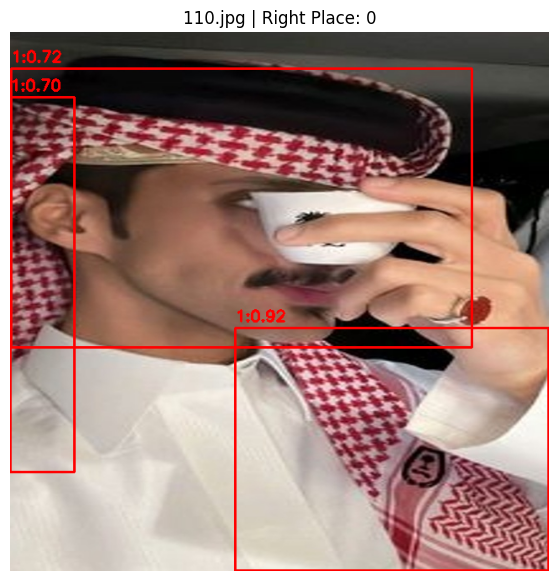

Inference:   2%|▏         | 15/842 [00:04<04:12,  3.28it/s]

IoU=0.00, center=0.36, area_ratio=351.89

Image: 111.jpg
Right Place: 0
1 0.9635 0.3764 0.5000 0.7517 1.0000


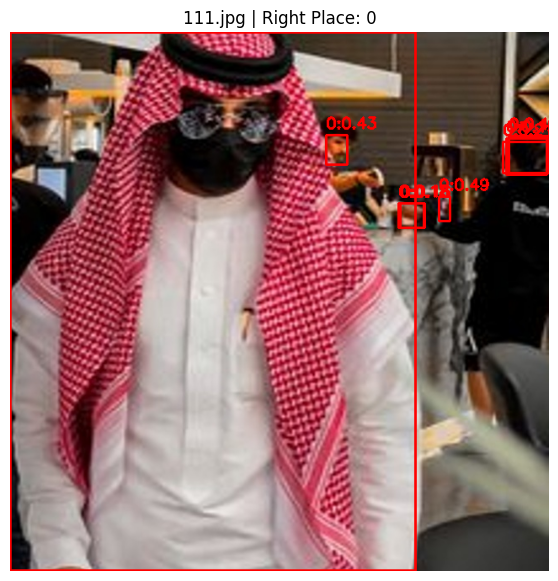

Inference:   2%|▏         | 16/842 [00:04<04:16,  3.22it/s]


Image: 112.jpg
Right Place: 0
No detections (after filtering)


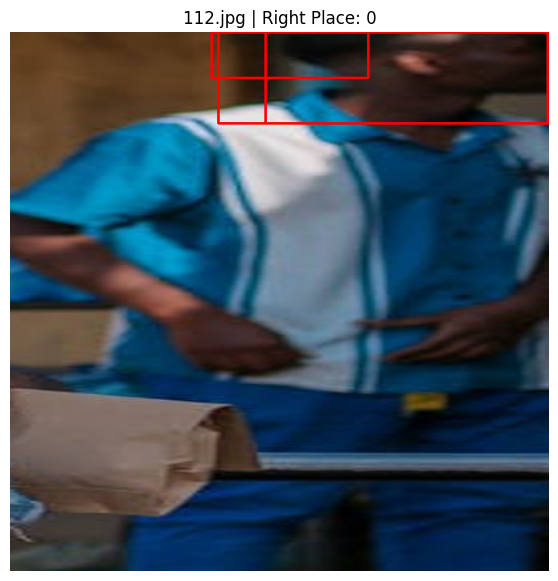

Inference:   2%|▏         | 17/842 [00:05<04:15,  3.23it/s]


Image: 113.jpg
Right Place: 0
No detections (after filtering)


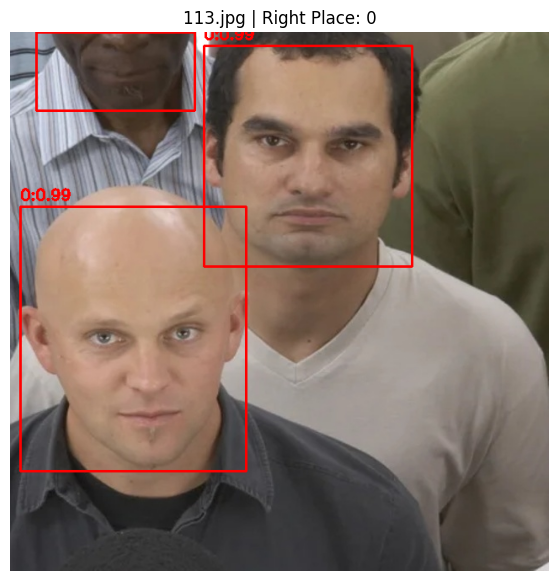

Inference:   2%|▏         | 18/842 [00:05<04:14,  3.24it/s]


Image: 114.jpg
Right Place: 0
1 0.3202 0.1406 0.9347 0.2739 0.1305


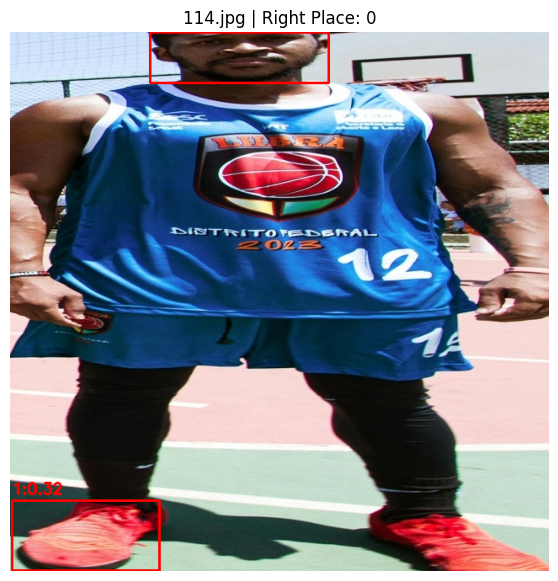

Inference:   2%|▏         | 19/842 [00:05<04:20,  3.15it/s]


Image: 115.jpg
Right Place: 0
No detections (after filtering)


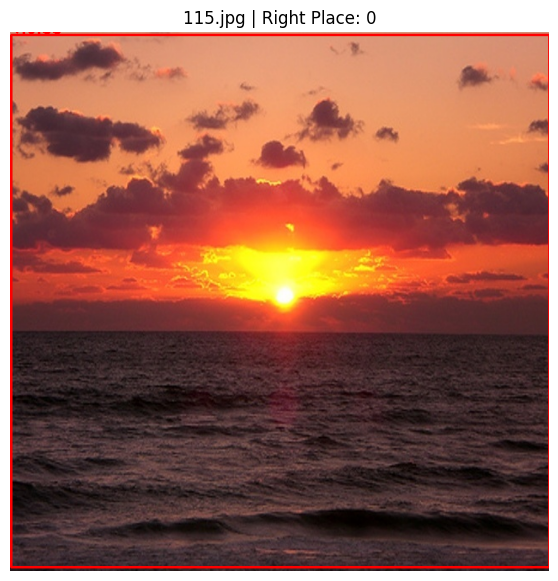

Inference:   2%|▏         | 20/842 [00:06<04:30,  3.03it/s]


Image: 116.jpg
Right Place: 0
No detections (after filtering)


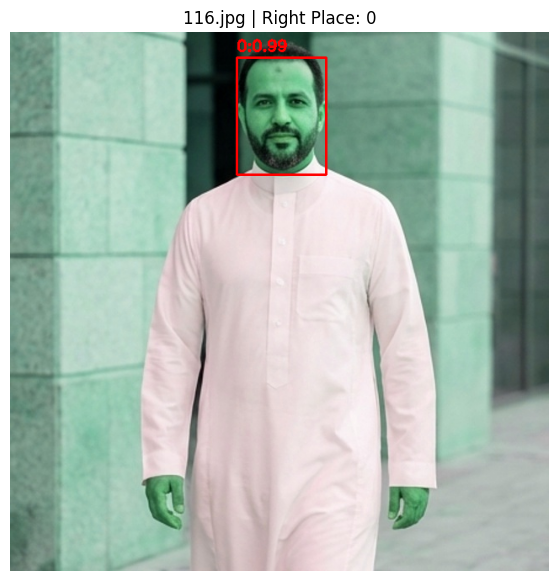

Inference:   2%|▏         | 21/842 [00:06<04:26,  3.09it/s]

IoU=0.14, center=0.13, area_ratio=6.98

Image: 117.jpg
Right Place: 1
1 0.9578 0.2340 0.4172 0.2623 0.6713


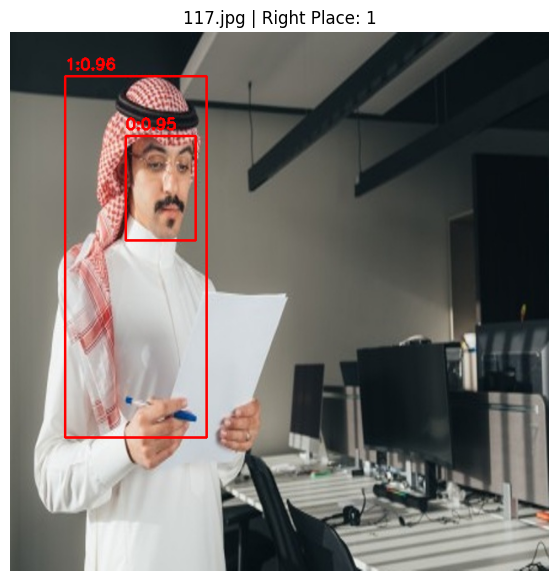

Inference:   3%|▎         | 22/842 [00:06<04:12,  3.24it/s]


Image: 118.jpg
Right Place: 0
1 0.9607 0.6118 0.5782 0.0710 0.3600


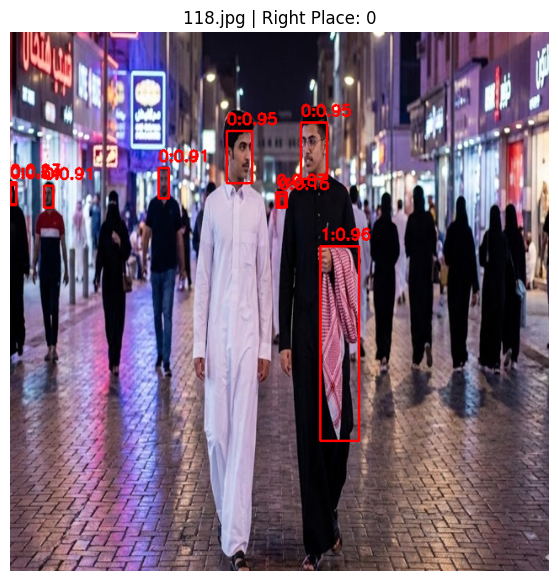

Inference:   3%|▎         | 23/842 [00:07<04:19,  3.16it/s]

IoU=0.06, center=0.29, area_ratio=15.70

Image: 119.jpg
Right Place: 1
1 0.4164 0.2626 0.5242 0.2970 0.9980


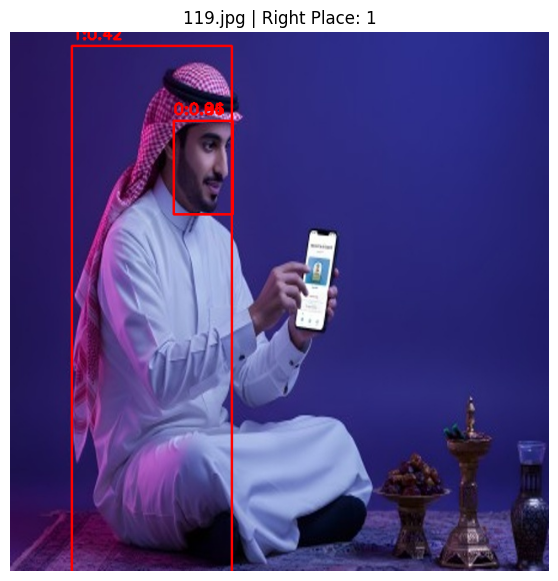

Inference:   3%|▎         | 24/842 [00:07<04:14,  3.22it/s]


Image: 12.jpg
Right Place: 0
No detections (after filtering)


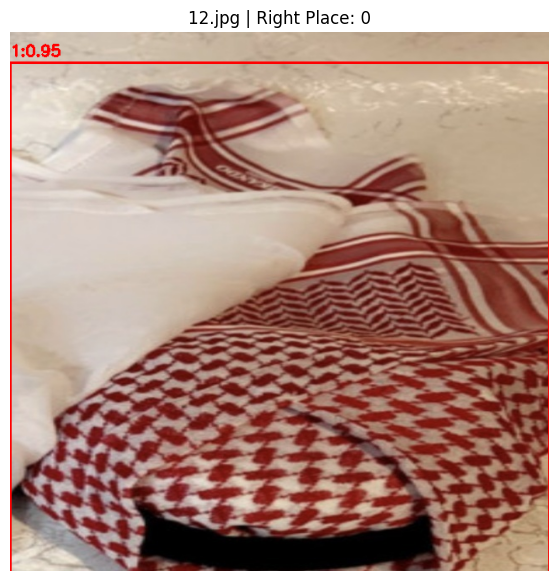

Inference:   3%|▎         | 25/842 [00:07<04:11,  3.25it/s]

IoU=0.06, center=0.43, area_ratio=2.43

Image: 120.jpg
Right Place: 1
1 0.9770 0.2762 0.7097 0.5512 0.5819


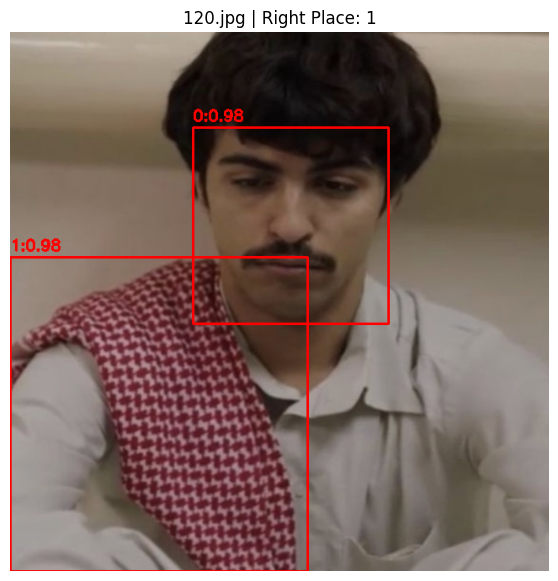

Inference:   3%|▎         | 26/842 [00:07<04:01,  3.38it/s]


Image: 121.jpg
Right Place: 0
No detections (after filtering)


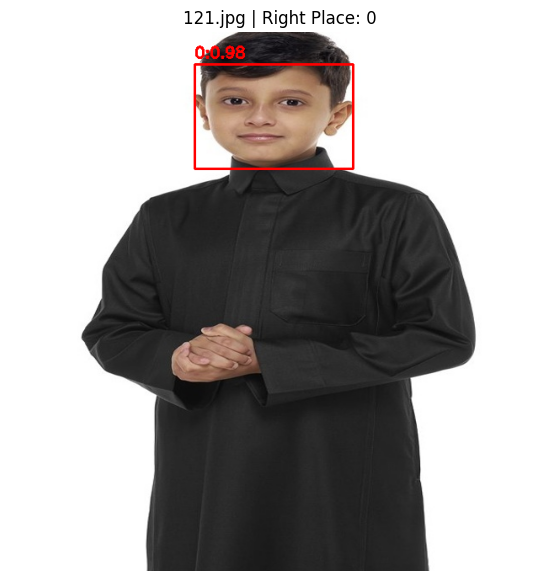

Inference:   3%|▎         | 27/842 [00:08<03:40,  3.69it/s]


Image: 122.jpg
Right Place: 0
No detections (after filtering)


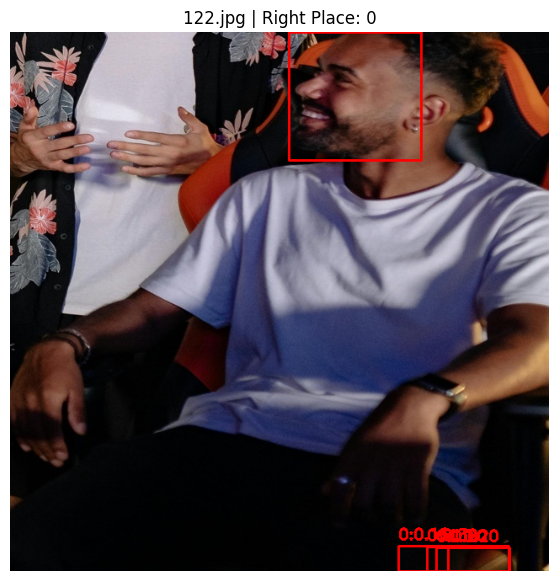

Inference:   3%|▎         | 28/842 [00:08<03:50,  3.54it/s]


Image: 123.jpg
Right Place: 0
No detections (after filtering)


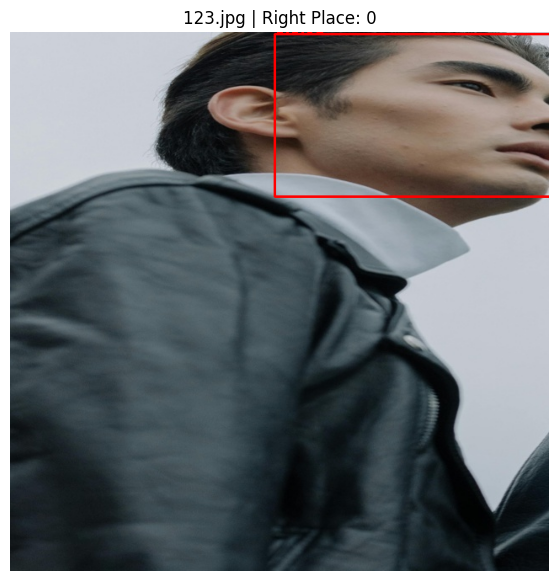

Inference:   3%|▎         | 29/842 [00:08<03:49,  3.55it/s]


Image: 124.jpg
Right Place: 0
No detections (after filtering)


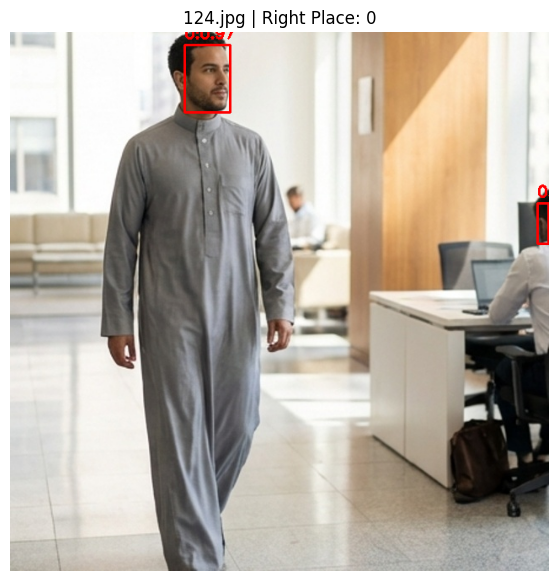

Inference:   4%|▍         | 36/842 [00:09<01:31,  8.81it/s]

IoU=0.18, center=0.16, area_ratio=5.67
IoU=0.14, center=0.17, area_ratio=7.29


Inference:   5%|▍         | 42/842 [00:09<00:57, 13.97it/s]

IoU=0.17, center=0.20, area_ratio=5.82
IoU=0.10, center=0.29, area_ratio=2.23


Inference:   8%|▊         | 70/842 [00:11<00:41, 18.69it/s]

IoU=0.06, center=0.25, area_ratio=17.29


Inference:   9%|▉         | 76/842 [00:11<00:41, 18.67it/s]

IoU=0.09, center=0.29, area_ratio=11.39


Inference:  11%|█         | 92/842 [00:12<00:39, 19.00it/s]

IoU=0.05, center=0.20, area_ratio=4.16
IoU=0.18, center=0.20, area_ratio=5.54


Inference:  12%|█▏        | 102/842 [00:13<00:38, 19.08it/s]

IoU=0.44, center=0.14, area_ratio=1.09


Inference:  13%|█▎        | 112/842 [00:13<00:38, 18.90it/s]

IoU=0.27, center=0.16, area_ratio=2.64


Inference:  14%|█▍        | 120/842 [00:13<00:38, 18.85it/s]

IoU=0.24, center=0.07, area_ratio=4.21


Inference:  15%|█▌        | 128/842 [00:14<00:37, 19.13it/s]

IoU=0.10, center=0.24, area_ratio=9.60


Inference:  16%|█▌        | 134/842 [00:14<00:37, 18.98it/s]

IoU=0.11, center=0.25, area_ratio=9.27
IoU=0.21, center=0.12, area_ratio=4.69


Inference:  16%|█▋        | 138/842 [00:14<00:37, 18.98it/s]

IoU=0.10, center=0.19, area_ratio=9.80
IoU=0.10, center=0.05, area_ratio=10.10


Inference:  17%|█▋        | 144/842 [00:15<00:37, 18.81it/s]

IoU=0.19, center=0.08, area_ratio=5.23
IoU=0.10, center=0.10, area_ratio=10.51


Inference:  18%|█▊        | 153/842 [00:15<00:36, 18.74it/s]

IoU=0.09, center=0.15, area_ratio=11.27
IoU=0.20, center=0.10, area_ratio=4.94
IoU=0.14, center=0.19, area_ratio=7.22
IoU=0.18, center=0.15, area_ratio=5.56


Inference:  19%|█▊        | 157/842 [00:15<00:37, 18.25it/s]

IoU=0.09, center=0.26, area_ratio=10.83


Inference:  19%|█▉        | 163/842 [00:16<00:37, 18.25it/s]

IoU=0.20, center=0.21, area_ratio=4.95
IoU=0.12, center=0.22, area_ratio=8.57


Inference:  20%|██        | 169/842 [00:16<00:37, 17.72it/s]

IoU=0.10, center=0.17, area_ratio=10.16


Inference:  21%|██▏       | 179/842 [00:17<00:35, 18.80it/s]

IoU=0.11, center=0.13, area_ratio=9.22


Inference:  22%|██▏       | 185/842 [00:17<00:35, 18.52it/s]

IoU=0.17, center=0.07, area_ratio=6.04


Inference:  22%|██▏       | 189/842 [00:17<00:36, 17.80it/s]

IoU=0.08, center=0.09, area_ratio=12.75
IoU=0.13, center=0.15, area_ratio=7.93


Inference:  23%|██▎       | 197/842 [00:18<00:34, 18.51it/s]

IoU=0.09, center=0.20, area_ratio=10.89


Inference:  24%|██▍       | 201/842 [00:18<00:34, 18.68it/s]

IoU=0.18, center=0.02, area_ratio=5.41


Inference:  25%|██▌       | 211/842 [00:18<00:33, 18.64it/s]

IoU=0.13, center=0.09, area_ratio=7.94
IoU=0.02, center=0.40, area_ratio=2.68


Inference:  26%|██▌       | 215/842 [00:19<00:33, 18.63it/s]

IoU=0.07, center=0.25, area_ratio=14.97


Inference:  27%|██▋       | 231/842 [00:20<00:32, 18.64it/s]

IoU=0.07, center=0.39, area_ratio=2.98
IoU=0.20, center=0.14, area_ratio=5.08


Inference:  29%|██▊       | 241/842 [00:20<00:32, 18.54it/s]

IoU=0.27, center=0.06, area_ratio=3.69


Inference:  29%|██▉       | 245/842 [00:20<00:32, 18.50it/s]

IoU=0.16, center=0.11, area_ratio=6.35
IoU=0.16, center=0.16, area_ratio=6.22
IoU=0.15, center=0.09, area_ratio=6.85


Inference:  30%|██▉       | 249/842 [00:20<00:31, 18.57it/s]

IoU=0.05, center=0.24, area_ratio=19.35
IoU=0.13, center=0.11, area_ratio=7.65


Inference:  31%|███       | 261/842 [00:21<00:31, 18.21it/s]

IoU=0.23, center=0.11, area_ratio=4.36


Inference:  32%|███▏      | 269/842 [00:22<00:30, 18.85it/s]

IoU=0.17, center=0.15, area_ratio=6.05


Inference:  34%|███▎      | 283/842 [00:22<00:29, 18.87it/s]

IoU=0.13, center=0.16, area_ratio=7.88
IoU=0.15, center=0.08, area_ratio=6.84


Inference:  35%|███▍      | 293/842 [00:23<00:29, 18.64it/s]

IoU=0.13, center=0.20, area_ratio=7.94
IoU=0.08, center=0.13, area_ratio=12.09


Inference:  36%|███▌      | 299/842 [00:23<00:28, 18.80it/s]

IoU=0.07, center=0.22, area_ratio=14.54


Inference:  37%|███▋      | 311/842 [00:24<00:28, 18.58it/s]

IoU=0.15, center=0.22, area_ratio=6.60
IoU=0.12, center=0.32, area_ratio=3.38


Inference:  38%|███▊      | 319/842 [00:24<00:28, 18.14it/s]

IoU=0.18, center=0.08, area_ratio=5.67
IoU=0.11, center=0.19, area_ratio=9.46


Inference:  39%|███▊      | 325/842 [00:25<00:27, 18.55it/s]

IoU=0.27, center=0.01, area_ratio=3.65
IoU=0.19, center=0.20, area_ratio=5.23


Inference:  40%|███▉      | 333/842 [00:25<00:27, 18.64it/s]

IoU=0.17, center=0.11, area_ratio=6.02
IoU=0.07, center=0.19, area_ratio=13.23
IoU=0.13, center=0.19, area_ratio=7.86


Inference:  40%|████      | 337/842 [00:25<00:27, 18.56it/s]

IoU=0.16, center=0.07, area_ratio=6.39


Inference:  40%|████      | 341/842 [00:25<00:26, 18.59it/s]

IoU=0.15, center=0.15, area_ratio=6.50


Inference:  42%|████▏     | 351/842 [00:26<00:26, 18.75it/s]

IoU=0.18, center=0.17, area_ratio=5.63


Inference:  44%|████▍     | 373/842 [00:27<00:25, 18.38it/s]

IoU=0.10, center=0.21, area_ratio=10.35


Inference:  45%|████▍     | 377/842 [00:27<00:25, 18.49it/s]

IoU=0.10, center=0.31, area_ratio=4.94
IoU=0.02, center=0.22, area_ratio=55.68


Inference:  45%|████▌     | 381/842 [00:28<00:24, 18.64it/s]

IoU=0.09, center=0.31, area_ratio=11.46


Inference:  46%|████▌     | 387/842 [00:28<00:25, 18.20it/s]

IoU=0.04, center=0.35, area_ratio=27.83


Inference:  47%|████▋     | 393/842 [00:28<00:24, 18.68it/s]

IoU=0.27, center=0.10, area_ratio=3.68


Inference:  47%|████▋     | 397/842 [00:28<00:23, 18.75it/s]

IoU=0.20, center=0.09, area_ratio=5.08
IoU=0.15, center=0.19, area_ratio=6.74
IoU=0.07, center=0.31, area_ratio=13.71


Inference:  48%|████▊     | 403/842 [00:29<00:23, 18.66it/s]

IoU=0.06, center=0.15, area_ratio=15.55
IoU=0.09, center=0.29, area_ratio=11.13


Inference:  49%|████▉     | 413/842 [00:29<00:23, 18.57it/s]

IoU=0.19, center=0.09, area_ratio=5.28


Inference:  50%|████▉     | 417/842 [00:29<00:23, 18.26it/s]

IoU=0.11, center=0.28, area_ratio=8.87


Inference:  50%|█████     | 421/842 [00:30<00:22, 18.32it/s]

IoU=0.05, center=0.33, area_ratio=19.57


Inference:  51%|█████     | 427/842 [00:30<00:23, 17.59it/s]

IoU=0.25, center=0.03, area_ratio=4.01


Inference:  51%|█████▏    | 433/842 [00:30<00:22, 17.79it/s]

IoU=0.21, center=0.06, area_ratio=4.86
IoU=0.05, center=0.22, area_ratio=18.53


Inference:  52%|█████▏    | 439/842 [00:31<00:22, 18.00it/s]

IoU=0.22, center=0.14, area_ratio=4.57
IoU=0.15, center=0.09, area_ratio=6.62


Inference:  54%|█████▎    | 451/842 [00:31<00:21, 18.23it/s]

IoU=0.14, center=0.09, area_ratio=7.06
IoU=0.03, center=0.38, area_ratio=5.22


Inference:  55%|█████▍    | 459/842 [00:32<00:20, 18.62it/s]

IoU=0.13, center=0.27, area_ratio=7.63
IoU=0.01, center=0.50, area_ratio=0.71
IoU=0.15, center=0.13, area_ratio=6.80


Inference:  55%|█████▌    | 465/842 [00:32<00:20, 18.51it/s]

IoU=0.16, center=0.19, area_ratio=6.45
IoU=0.09, center=0.12, area_ratio=11.38
IoU=0.12, center=0.20, area_ratio=4.40


Inference:  56%|█████▋    | 475/842 [00:33<00:19, 18.68it/s]

IoU=0.23, center=0.16, area_ratio=4.42


Inference:  58%|█████▊    | 485/842 [00:33<00:19, 18.68it/s]

IoU=0.22, center=0.12, area_ratio=4.55


Inference:  58%|█████▊    | 489/842 [00:33<00:18, 18.60it/s]

IoU=0.24, center=0.05, area_ratio=4.09
IoU=0.15, center=0.12, area_ratio=6.73
IoU=0.16, center=0.13, area_ratio=6.10


Inference:  60%|█████▉    | 501/842 [00:34<00:18, 18.59it/s]

IoU=0.20, center=0.14, area_ratio=5.03


Inference:  60%|██████    | 507/842 [00:34<00:18, 18.55it/s]

IoU=0.17, center=0.07, area_ratio=5.92


Inference:  62%|██████▏   | 521/842 [00:35<00:17, 18.69it/s]

IoU=0.18, center=0.06, area_ratio=5.49
IoU=0.18, center=0.11, area_ratio=5.47


Inference:  63%|██████▎   | 529/842 [00:36<00:16, 18.64it/s]

IoU=0.16, center=0.12, area_ratio=6.23
IoU=0.09, center=0.31, area_ratio=6.89
IoU=0.11, center=0.09, area_ratio=8.82


Inference:  64%|██████▎   | 535/842 [00:36<00:16, 18.40it/s]

IoU=0.23, center=0.18, area_ratio=4.36
IoU=0.12, center=0.28, area_ratio=8.07


Inference:  64%|██████▍   | 543/842 [00:36<00:16, 18.59it/s]

IoU=0.20, center=0.05, area_ratio=5.01
IoU=0.16, center=0.25, area_ratio=6.22


Inference:  66%|██████▌   | 557/842 [00:37<00:15, 18.42it/s]

IoU=0.06, center=0.25, area_ratio=16.22


Inference:  67%|██████▋   | 565/842 [00:38<00:14, 18.49it/s]

IoU=0.18, center=0.16, area_ratio=5.64


Inference:  68%|██████▊   | 575/842 [00:38<00:14, 18.28it/s]

IoU=0.11, center=0.16, area_ratio=9.00
IoU=0.13, center=0.11, area_ratio=7.67


Inference:  69%|██████▉   | 585/842 [00:39<00:13, 18.86it/s]

IoU=0.12, center=0.10, area_ratio=8.31
IoU=0.15, center=0.23, area_ratio=6.68


Inference:  70%|███████   | 593/842 [00:39<00:13, 18.42it/s]

IoU=0.27, center=0.06, area_ratio=3.64


Inference:  71%|███████   | 599/842 [00:39<00:13, 18.53it/s]

IoU=0.06, center=0.43, area_ratio=5.77


Inference:  73%|███████▎  | 613/842 [00:40<00:11, 19.08it/s]

IoU=0.11, center=0.15, area_ratio=8.98


Inference:  77%|███████▋  | 651/842 [00:42<00:10, 18.19it/s]

IoU=0.08, center=0.18, area_ratio=12.26
IoU=0.15, center=0.14, area_ratio=6.48


Inference:  78%|███████▊  | 655/842 [00:42<00:10, 18.21it/s]

IoU=0.08, center=0.14, area_ratio=11.88
IoU=0.18, center=0.19, area_ratio=5.69


Inference:  79%|███████▊  | 663/842 [00:43<00:09, 18.77it/s]

IoU=0.11, center=0.21, area_ratio=9.15


Inference:  80%|███████▉  | 671/842 [00:43<00:09, 18.87it/s]

IoU=0.13, center=0.25, area_ratio=7.92


Inference:  81%|████████▏ | 685/842 [00:44<00:08, 18.29it/s]

IoU=0.10, center=0.13, area_ratio=9.81


Inference:  82%|████████▏ | 689/842 [00:44<00:08, 18.42it/s]

IoU=0.12, center=0.18, area_ratio=8.44
IoU=0.07, center=0.10, area_ratio=15.07


Inference:  84%|████████▍ | 707/842 [00:45<00:07, 18.86it/s]

IoU=0.19, center=0.22, area_ratio=5.23
IoU=0.08, center=0.19, area_ratio=11.88


Inference:  85%|████████▍ | 713/842 [00:46<00:06, 18.47it/s]

IoU=0.12, center=0.08, area_ratio=8.63
IoU=0.20, center=0.15, area_ratio=4.90


Inference:  85%|████████▌ | 717/842 [00:46<00:06, 18.67it/s]

IoU=0.14, center=0.09, area_ratio=7.32
IoU=0.03, center=0.44, area_ratio=4.58
IoU=0.15, center=0.11, area_ratio=6.84


Inference:  86%|████████▌ | 725/842 [00:46<00:06, 18.87it/s]

IoU=0.18, center=0.25, area_ratio=5.37
IoU=0.14, center=0.12, area_ratio=7.22
IoU=0.10, center=0.30, area_ratio=2.56


Inference:  88%|████████▊ | 737/842 [00:47<00:05, 18.24it/s]

IoU=0.19, center=0.07, area_ratio=5.30


Inference:  88%|████████▊ | 741/842 [00:47<00:05, 18.54it/s]

IoU=0.10, center=0.30, area_ratio=10.11
IoU=0.43, center=0.07, area_ratio=2.33


Inference:  88%|████████▊ | 745/842 [00:47<00:05, 18.45it/s]

IoU=0.21, center=0.19, area_ratio=2.64
IoU=0.04, center=0.12, area_ratio=22.80


Inference:  89%|████████▉ | 753/842 [00:48<00:04, 18.56it/s]

IoU=0.10, center=0.18, area_ratio=9.71


Inference:  90%|████████▉ | 757/842 [00:48<00:04, 18.34it/s]

IoU=0.16, center=0.22, area_ratio=6.27


Inference:  91%|█████████▏| 769/842 [00:49<00:03, 18.43it/s]

IoU=0.17, center=0.09, area_ratio=6.02


Inference:  92%|█████████▏| 775/842 [00:49<00:03, 18.84it/s]

IoU=0.14, center=0.16, area_ratio=2.88


Inference:  93%|█████████▎| 781/842 [00:49<00:03, 18.92it/s]

IoU=0.14, center=0.09, area_ratio=6.98


Inference:  94%|█████████▎| 789/842 [00:50<00:02, 18.77it/s]

IoU=0.14, center=0.11, area_ratio=7.24


Inference:  94%|█████████▍| 795/842 [00:50<00:02, 18.77it/s]

IoU=0.21, center=0.12, area_ratio=4.77
IoU=0.16, center=0.17, area_ratio=6.11


Inference:  95%|█████████▍| 799/842 [00:50<00:02, 18.74it/s]

IoU=0.10, center=0.26, area_ratio=10.00


Inference:  96%|█████████▌| 805/842 [00:50<00:01, 18.89it/s]

IoU=0.21, center=0.19, area_ratio=4.68


Inference:  97%|█████████▋| 813/842 [00:51<00:01, 18.87it/s]

IoU=0.19, center=0.11, area_ratio=5.25


Inference:  97%|█████████▋| 819/842 [00:51<00:01, 18.94it/s]

IoU=0.10, center=0.14, area_ratio=10.04
IoU=0.07, center=0.29, area_ratio=14.14


Inference:  98%|█████████▊| 823/842 [00:51<00:01, 18.95it/s]

IoU=0.15, center=0.09, area_ratio=6.83
IoU=0.10, center=0.15, area_ratio=9.98


Inference:  98%|█████████▊| 829/842 [00:52<00:00, 18.77it/s]

IoU=0.17, center=0.14, area_ratio=5.87
IoU=0.06, center=0.40, area_ratio=2.24


Inference:  99%|█████████▉| 835/842 [00:52<00:00, 18.92it/s]

IoU=0.17, center=0.13, area_ratio=5.98
IoU=0.08, center=0.21, area_ratio=12.66
IoU=0.24, center=0.14, area_ratio=4.20
IoU=0.07, center=0.28, area_ratio=14.94


Inference: 100%|██████████| 842/842 [00:52<00:00, 15.92it/s]


✓ Submission generated!
Total rows: 842
With detections: 324
Without detections: 518


In [13]:
print("Generating submission file...\n")

test_img_dir = os.path.join(ROOT_DIR, "images/test")
submission_rows = []

# ===== DEBUG TOGGLES =====
DEBUG_PRINT = True
DEBUG_VIS   = True
DEBUG_N     = 30
# =========================

# ===== TUNABLE THRESHOLDS =====
PRED_CONF = 0.15          # RT-DETR confidences أنظف
PERSON_MIN_CONF  = 0.35
SHEMAGH_MIN_CONF = 0.20

MAX_PERSON  = 1           # RT-DETR أقل ضجيج
MAX_SHEMAGH = 2
# ===============================

test_images = sorted([f for f in os.listdir(test_img_dir) if f.endswith(('.jpg', '.png', '.jpeg'))])
print(f"Found {len(test_images)} test images\n")

for idx, filename in enumerate(tqdm(test_images, desc="Inference")):
    img_path = os.path.join(test_img_dir, filename)

    results = model.predict(
        source=img_path,
        conf=PRED_CONF,
        device=0,
        verbose=False
    )[0]



    pred_parts = []
    person_boxes = []   # [x,y,w,h,conf]
    shemagh_boxes = []  # [x,y,w,h,conf]

    # --- Parse detections with filters ---
    if len(results.boxes) == 0:
        prediction_string = "-"
        right_place = 0
    else:
        for box in results.boxes:
            cls = int(box.cls[0])
            conf = float(box.conf[0])
            x, y, w, h = box.xywhn[0].tolist()

            # per-class confidence filters
            if cls == 0 and conf < PERSON_MIN_CONF:
                continue
            if cls == 1 and conf < SHEMAGH_MIN_CONF:
                continue

            # light area sanity filters (normalized)
            area = w * h
            if cls == 0 and area < 0.002:   # tiny "person" noise
                continue
            if cls == 1 and area > 0.85:    # absurd huge "shemagh"
                continue

            # pred_parts.append(f"{cls} {conf:.4f} {x:.4f} {y:.4f} {w:.4f} {h:.4f}")

            if cls == 1:
                pred_parts.append(
                    f"{cls} {conf:.4f} {x:.4f} {y:.4f} {w:.4f} {h:.4f}"
                )


            if cls == 0:
                person_boxes.append([x, y, w, h, conf])
            elif cls == 1:
                shemagh_boxes.append([x, y, w, h, conf])

        prediction_string = " ".join(pred_parts) if pred_parts else "-"
        right_place = 0

        # Keep only top-K by confidence (prevents junk pairs)
        person_boxes  = sorted(person_boxes,  key=lambda b: b[-1], reverse=True)[:MAX_PERSON]
        shemagh_boxes = sorted(shemagh_boxes, key=lambda b: b[-1], reverse=True)[:MAX_SHEMAGH]

        # ---- Your best-pair IoU logic (kept) ----
        if person_boxes and shemagh_boxes:
            best_iou = 0.0
            best_pair = None

            for p_idx, p_box in enumerate(person_boxes):
                for s_idx, s_box in enumerate(shemagh_boxes):
                    iou = calculate_iou(p_box[:4], s_box[:4])
                    if iou > best_iou:
                        best_iou = iou
                        best_pair = (p_idx, s_idx)

            if best_pair is not None:
                p_box = person_boxes[best_pair[0]]
                s_box = shemagh_boxes[best_pair[1]]

                iou_threshold = 0.10
                min_area_ratio = 0.15  # 0.4 is too strict; start 0.10-0.20

                iou_ok = best_iou > iou_threshold
                area_ratio = (s_box[2] * s_box[3]) / (p_box[2] * p_box[3] + 1e-9)
                size_ok = area_ratio > min_area_ratio

                # ---------- IMPROVED RIGHT_PLACE LOGIC ----------

                # centers
                px, py = p_box[0], p_box[1]
                sx, sy = s_box[0], s_box[1]
                
                # 1) IoU check (خفيف)
                iou_ok = best_iou > 0.05   # خففناه
                
                # 2) Center distance (مهم)
                center_dist = ((px - sx)**2 + (py - sy)**2) ** 0.5
                center_ok = center_dist < 0.25   # normalized distance
                
                # 3) Vertical alignment
                # الشماغ غالبًا فوق أو قريب من الوجه
                vertical_ok = sy < py + 0.15
                
                # 4) Size sanity
                area_ratio = (s_box[2] * s_box[3]) / (p_box[2] * p_box[3] + 1e-9)
                size_ok = area_ratio > 0.08   # أخف من قبل
                
                # ---- FINAL DECISION ----
                if (iou_ok and size_ok) or (center_ok and vertical_ok and size_ok):
                    right_place = 1
                if DEBUG_PRINT:
                    print(f"IoU={best_iou:.2f}, center={center_dist:.2f}, area_ratio={area_ratio:.2f}")


    # ===== DEBUG PRINT =====
    if DEBUG_PRINT and (DEBUG_N is None or idx < DEBUG_N):
        print(f"\nImage: {filename}")
        print(f"Right Place: {right_place}")
        if prediction_string == "-":
            print("No detections (after filtering)")
        else:
            for part in pred_parts:
                print(part)

    # ===== DEBUG VISUALIZATION (fixed indentation) =====
    if DEBUG_VIS and (DEBUG_N is None or idx < DEBUG_N):
        import cv2
        import matplotlib.pyplot as plt

        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        for box in results.boxes:
            x1, y1, x2, y2 = map(int, box.xyxy[0])
            cls = int(box.cls[0])
            conf = float(box.conf[0])
            label = f"{cls}:{conf:.2f}"
            cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 2)
            cv2.putText(
                img, label, (x1, max(0, y1 - 8)),
                cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2
            )

        plt.figure(figsize=(7, 7))
        plt.title(f"{filename} | Right Place: {right_place}")
        plt.axis("off")
        plt.imshow(img)
        plt.show()

    submission_rows.append({
        "filename": filename,
        "right_place": right_place,
        "prediction_string": prediction_string
    })

submission = pd.DataFrame(submission_rows)

print("\n✓ Submission generated!")
print(f"Total rows: {len(submission)}")
print(f"With detections: {(submission['prediction_string'] != '-').sum()}")
print(f"Without detections: {(submission['prediction_string'] == '-').sum()}")


## 💾 Save Submission

In [14]:
# Save to CSV
submission.to_csv("submission.csv", index=False)

print("\n" + "="*60)
print("✓ SUBMISSION SAVED: submission.csv")
print("="*60)
print("\nFirst 10 rows:")
display(submission.head(10))


✓ SUBMISSION SAVED: submission.csv

First 10 rows:


,filename,right_place,prediction_string
0,0.jpg,0,-
1,1.jpg,0,1 0.9478 0.3061 0.5004 0.6115 0.9857
2,10.jpg,0,-
3,100.jpg,0,1 0.9725 0.4994 0.5758 0.9954 0.8314
4,101.jpg,0,1 0.9375 0.4436 0.6452 0.8825 0.7109
5,102.jpg,0,-
6,103.jpg,0,-
7,104.jpg,1,1 0.9415 0.4785 0.1885 0.2426 0.3623
8,105.jpg,0,-
9,106.jpg,0,-


---

## 🎯 Next Steps

This baseline gives you a working submission. To improve your score:

1. **Add Augmentations** - Try to add augmentations
2. **Use larger model** - Try `yolov8s.pt` or `yolov8m.pt`
3. **Train longer** - Increase epochs to 100-200
4. **Add classification model** - Build a model for `right_place` instead of always using 0 (or maybe think about a more elegant way to predict it!)

---

Good luck! 🍀